In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm_notebook
from datetime import datetime
from collections import Counter
import warnings
warnings.filterwarnings('ignore')
# Define categories for different coverage content
topics = ['face mask', 'hand sanitizer', 'medical supplies', 'test kits',
          'flu', 'common cold', 'social distancing', 'shelter in place',
          'school closure', 'travel ban']           

groupings = {
            'Medical Supplies':['medical supplies','test kits'],
            'PPE':['face mask','hand sanitizer'],
            'Recommendations':['social distancing', 'shelter in place'],
            'Restrictions':['school closure', 'travel ban'],
            'Seasonal Flu':['flu', 'common cold']
             }

themes = ['medical supplies','ppe','recommendations','restrictions','seasonal flu']

theme_map = {
             "medical supplies": "Medical Supplies",
             "ppe": "PPE",
             "recommendations": "Recommendations",
             "restrictions": "Restrictions",
             "seasonal flu": "Seasonal Flu"
            }

orange, purple, elm, grey ='#FFCC00', '#666599', '#217C7E', '#F5F5F5'
blue, red, green ='#336699', '#9A3334', '#335333'

color_p = {'news':elm,
           'blogs':orange,
           'discussions':purple}

color_g = {'PPE':orange,
           'Medical Supplies':red,
           'Seasonal Flu':purple,
           'Recommendations':green,
           'Restrictions':blue,
           }

__author__ = 'Haomin Lin'
__version__ = 'Python3'

In [2]:
# Read informatin from different platforms
path_info_news = '../src/Data/info_news.csv'
info_news = pd.read_csv(path_info_news,index_col=0)
# info_news = info_news[info_news['length']>100]
info_news = info_news[['date','country','sentiment','topic','theme']]
info_news['date'] = [datetime.strftime(pd.to_datetime(date), '%Y-%m-%d') for date in tqdm_notebook(info_news['date'])]

path_info_blog = '../src/Data/info_blogs.csv'
info_blog = pd.read_csv(path_info_blog,index_col=0)
# info_blog = info_blog[info_blog['length']>100]
info_blog = info_blog[['date','country','sentiment','topic','theme']]
info_blog['date'] = [datetime.strftime(pd.to_datetime(date), '%Y-%m-%d') for date in tqdm_notebook(info_blog['date'])]

path_info_disc = '../src/Data/info_discussions.csv'
info_disc = pd.read_csv(path_info_disc,index_col=0)
# info_disc = info_disc[info_disc['length']>100]
info_disc = info_disc[['date','country','sentiment','topic','theme']]
info_disc['date'] = [datetime.strftime(pd.to_datetime(date), '%Y-%m-%d') for date in tqdm_notebook(info_disc['date'])]

In [3]:
# Select countries common in all 3 data sets
country_map = Counter(set(info_news['country']))+Counter(set(info_blog['country']))+ Counter(set(info_disc['country']))
common_locations = []
for k,v in tqdm_notebook(country_map.items()):
    if (v == 3) and (k==k):
        common_locations.append(k)
print("Common Countries:", len(common_locations))


Common Countries: 79


In [4]:
# Filter data by common countries
news = info_news[info_news['country'].isin(common_locations)]
blogs = info_blog[info_blog['country'].isin(common_locations)]
discussions = info_disc[info_disc['country'].isin(common_locations)]
print ("News:", len(news))
print ("Blogs:", len(blogs))
print ("Discussions:", len(discussions))

platforms = {'news':news,
             'blogs':blogs,
             'discussions':discussions}

News: 2277563
Blogs: 946755
Discussions: 409091


In [5]:
# Assign data for all dates
dates = sorted(list(set(info_news['date']).union(set(info_blog['date'])).union(set(info_disc['date']))))[1:-1]
dates_ = [date[5:].replace('-','/') for date in dates]
n_x = len(dates_)

In [6]:
platform_daily_theme = {}
for p in tqdm_notebook(platforms):
    theme_daily_topic_share = {}
    theme_daily_sentiment = {}
    for t in themes:
        theme_df = platforms[p][(platforms[p]['theme'].str.contains(t))]
        theme_sentiment = platforms[p][(platforms[p]['theme'].str.contains(t))][['date','sentiment']].groupby('date').agg('mean').to_dict()['sentiment']
        es = {key: np.true_divide(Counter(theme_df['date'])[key], Counter(platforms[p]['date']).get(key, 0)) for key in Counter(theme_df['date']).keys()}
        daily_topic_share_map = {}
        daily_sentiment_map = {}
        for date in dates: 
            daily_topic_share_map[date] = es.get(date, 0)
            daily_sentiment_map[date] = theme_sentiment.get(date, 0)
        theme_daily_topic_share[theme_map[t]] = pd.Series(daily_topic_share_map).fillna(0).rolling(10, win_type='triang').mean()
        theme_daily_sentiment[theme_map[t]] = pd.Series(daily_sentiment_map).fillna(0).rolling(10, win_type='triang').mean()
    platform_daily_theme[p] = [theme_daily_topic_share, theme_daily_sentiment]

In [7]:
platform_daily_topic = {}
for p in tqdm_notebook(platforms):
    topic_daily_topic_share = {}
    topic_daily_sentiment = {}
    for t in topics:
        topic_df = platforms[p][(platforms[p]['topic'].str.contains(t))]
        topic_sentiment = platforms[p][(platforms[p]['topic'].str.contains(t))][['date','sentiment']].groupby('date').agg('mean').to_dict()['sentiment']
        es = {key: np.true_divide(Counter(topic_df['date'])[key], Counter(platforms[p]['date']).get(key, 0)) for key in Counter(topic_df['date']).keys()}
        daily_topic_share_map = {}
        daily_sentiment_map = {}
        for date in dates: 
            daily_topic_share_map[date] = es.get(date, 0)
            daily_sentiment_map[date] = topic_sentiment.get(date, 0)
        topic_daily_topic_share[t] = pd.Series(daily_topic_share_map).fillna(0).rolling(10, win_type='triang').mean()
        topic_daily_sentiment[t] = pd.Series(daily_sentiment_map).fillna(0).rolling(10, win_type='triang').mean()
    platform_daily_topic[p] = [topic_daily_topic_share, topic_daily_sentiment]

In [8]:
def create_vis(data):
    mat_data = {}
    all_platform=[]
    for i in data:
        mat_data[i] = {}   
        for j in range(1):
            cat_type = ['ts', 'sent'][j]
            output = []
            for n in data[i][j]:
                s = pd.Series(data[i][j][n])
                df = s.to_frame(name = 'topic_share')
                df['Theme'] = [n]*120
                df['Platforms'] = [i]*120
                df.index = dates
                output.append(df)
            df_out = pd.concat(output).fillna(0)
            df_out['date'] = df_out.index
            all_platform.append(df_out)
            df_out = df_out.pivot("Theme", "date", "topic_share")
            mat_data[i][cat_type] = (df_out)
    return mat_data

In [9]:
heat_groupings = create_vis(platform_daily_theme)
heat_topics = create_vis(platform_daily_topic)

# Make plots

## 1 Functions

In [10]:
def plot_multiparam(data, param_comb, listing, font_size = 16, ensemble=False):

    n = len(dates_)

    if ensemble:
        if listing != topics:
            f, axes = plt.subplots(5, 1, figsize=(12, 24), sharey=False, dpi=200)
        else:
            f, axes = plt.subplots(4, 3, figsize=(12, 12), sharey=False, dpi=200)

    info_cat = ['Topic Share', 'Sentiment']
    if len(listing) > 5:
        info_cat[0] = 'Topic Share'

    label_cat = ['topic share', 'sentiment']
    if len(set(param_comb)) == 1:
        name_cat = label_cat
        label_cat = ['','']
    
    for i in range(len(listing)):

        item = listing[i]

        if not ensemble:
            fig, ax1 = plt.subplots(figsize=(10,5), dpi=200)  
            if listing == topics:
                save_name = 'topics_'
            else:
                save_name = 'groupings_'
            if len(set(param_comb)) == 1:
                save_name = save_name + name_cat[param_comb[0]] + '_' + item + '.jpg'
            else:
                save_name = save_name + 'hybrid_' + item + '.jpg'
        else:
            if listing == topics:
                x = i//3
                y = i%3
                if i == 9:
                    y = 1
                ax1 = axes[x,y]
            else:
                ax1 = axes[i]

        if len(set(param_comb)) == 1:
            ax2 = ax1
        else:
            ax2 = ax1.twinx()
            plt.ylabel(info_cat[param_comb[1]], fontsize=font_size)

        l1, = ax1.plot(dates_, data['news'][param_comb[0]][item], color=color_p['news'], label='news '+label_cat[param_comb[0]])
        l2, = ax2.plot(dates_, data['blogs'][param_comb[1]][item], color=color_p['blogs'], label='blogs '+label_cat[param_comb[1]]) 
        l3, = ax2.plot(dates_, data['discussions'][param_comb[2]][item], color=color_p['discussions'], label='discussions '+label_cat[param_comb[2]]) 

        leg = [l1, l2, l3]
        labs = [l.get_label() for l in leg]
        ax1.legend(leg, labs, loc='best', fontsize=font_size)

        plt.sca(ax1)
        plt.title(item, fontsize=font_size)
        plt.xticks(np.arange(0, n+7, 7), rotation=270, fontsize = font_size)
        plt.yticks(fontsize=font_size)
        plt.ylabel(info_cat[param_comb[0]], fontsize=font_size)
    
        if len(set(param_comb)) > 1:
            plt.sca(ax2)
            plt.xticks(np.arange(0, n+7, 7), rotation=270, fontsize = font_size)
            plt.yticks(fontsize=font_size)
            plt.ylabel(info_cat[param_comb[1]],fontsize=font_size)
    
        if not ensemble:
            plt.savefig(save_name)
  
    if ensemble:
        suptitle=' Ensemble'
        plt.subplots_adjust(hspace=0.3,wspace=0.5)
        if listing == topics:
            save_name = 'topics_'
            suptitle = 'Topics' + suptitle
        else:
            save_name = 'groupings_'
            suptitle = 'Groupings' + suptitle
        if len(set(param_comb)) > 1:
            save_name = save_name + 'hybrid_ensemble.jpg'
            suptitle = 'Hybrid ' + suptitle
        else:
            save_name = save_name + name_cat[param_comb[0]] + '_ensemble.jpg'
            suptitle = name_cat[param_comb[0]].title() + ' ' + suptitle
        plt.suptitle(suptitle, y=0.99, fontsize=20)
        plt.tight_layout()
        plt.savefig(save_name)

In [11]:
def among_group(data, cat, listing, font_size = 16, ensemble=False):

    n = len(dates_)

    info_cat = ['Topic Share', 'Sentiment']
    label_cat = ['topic share', 'sentiment']

    if ensemble:
        f, axes = plt.subplots(3, 1, figsize=(12, 24), sharey=False, dpi=200)

    i = 0

    for p in list(platforms.keys())[-3:]:

        if not ensemble:
            fig, ax1 = plt.subplots(figsize=(10,5), dpi=200)
        else:
            ax1 = axes[i]

        for item in listing:
            ax1.plot(dates_, data[p][cat][item], color=color_g[item], label = item) 

            plt.sca(ax1)
            plt.title(p, fontsize=16)
            plt.ylabel(info_cat[cat], fontsize=16)
            plt.xticks(np.arange(0, n+7, 7), rotation=270)
            plt.xticks(fontsize=16)
            plt.yticks(fontsize=16)
            plt.legend(loc='best',fontsize=16)

        if not ensemble:
            plt.savefig('among_groupings_{}.jpg'.format(p))

        i+=1

    if ensemble:
        plt.suptitle('Among Groupings Ensemble', y=1, fontsize=20)
        plt.tight_layout()
        plt.subplots_adjust(hspace=0.3)
        plt.savefig('among_groupings_ensemble.jpg')

In [12]:
def heatmap_plt(data):
    for i in data:
        mat = data[i]['ts']
        fig, ax1 = plt.subplots(figsize=(10,3), dpi=200)
        ax = sns.heatmap(mat, cmap="YlGnBu",xticklabels = 7,
                        cbar_kws={'label': 'Topic Share'})
        ax.set_ylabel('')    
        ax.set_xlabel('')
        ax.tick_params(axis='both', which='both', length=0)
        plt.title('Themes topic share - {}'.format(i))
        plt.savefig('themes_ts_{}.jpg'.format(i),bbox_inches = 'tight')

## 2 Executions

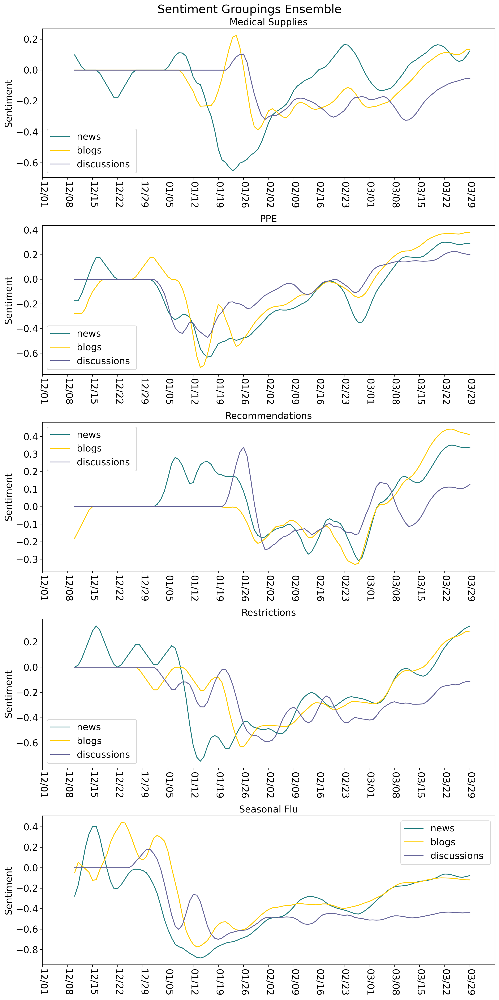

In [13]:
plot_multiparam(platform_daily_theme, [1,1,1], list(groupings.keys()), 16, True)

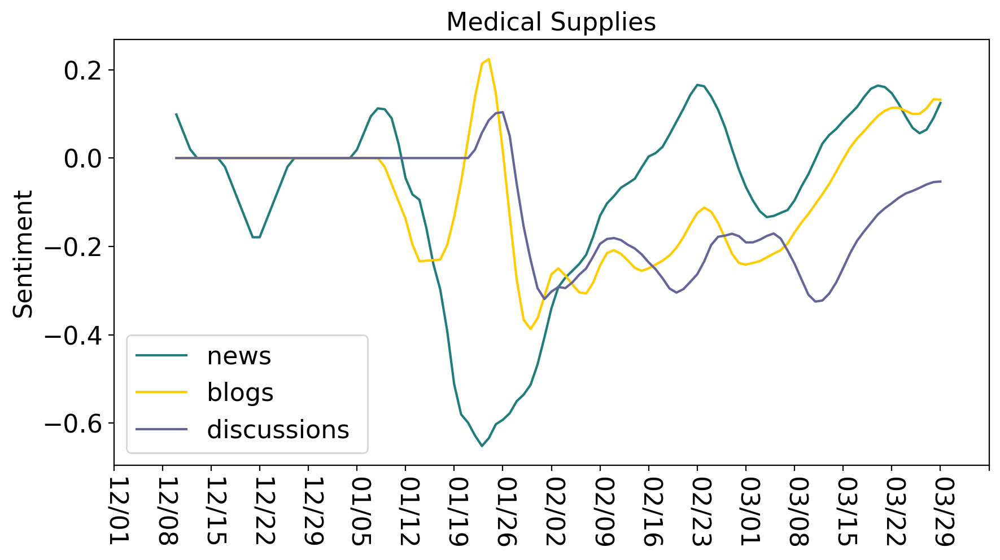

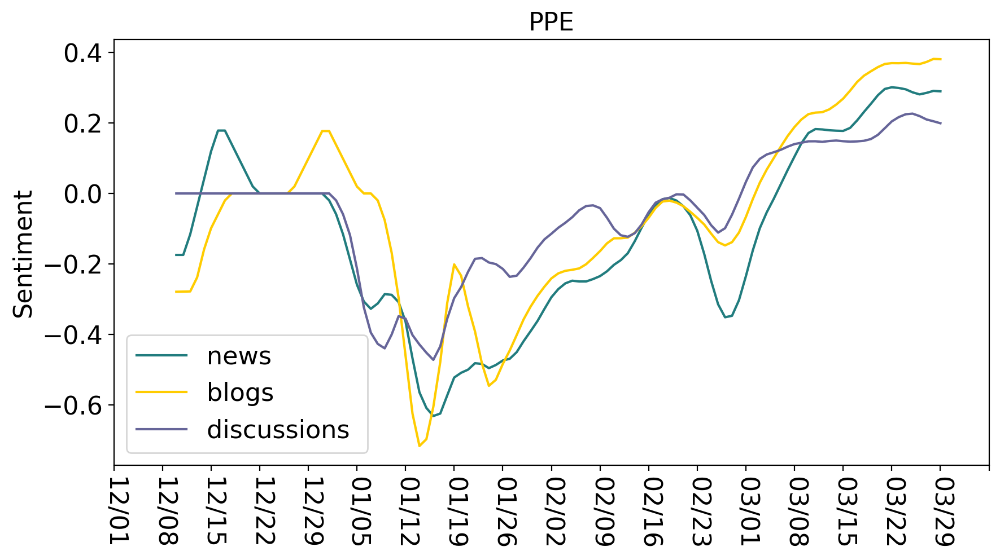

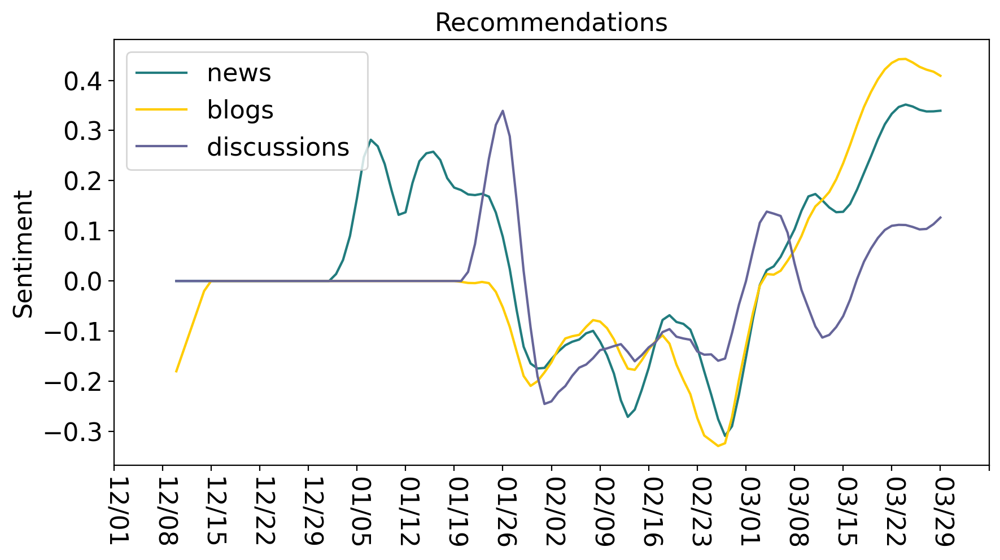

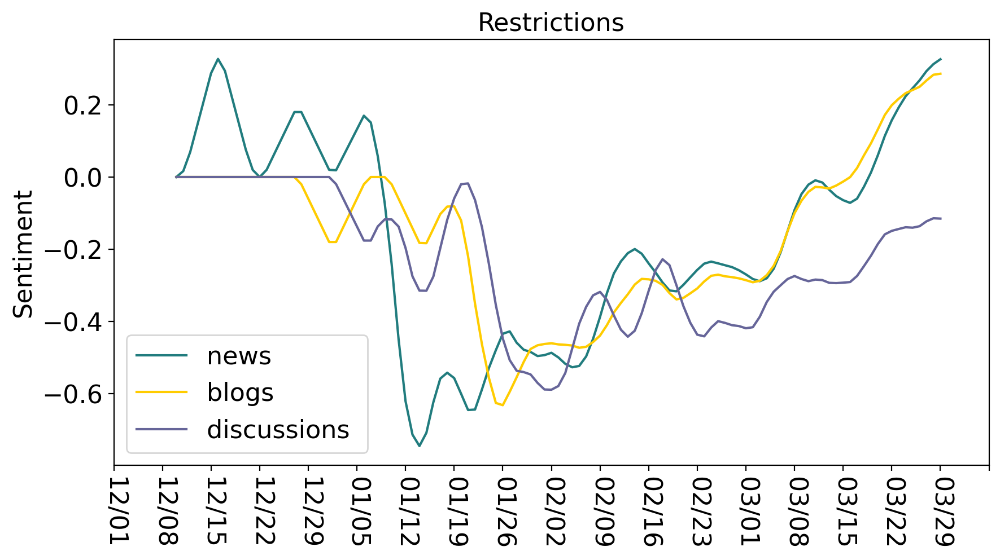

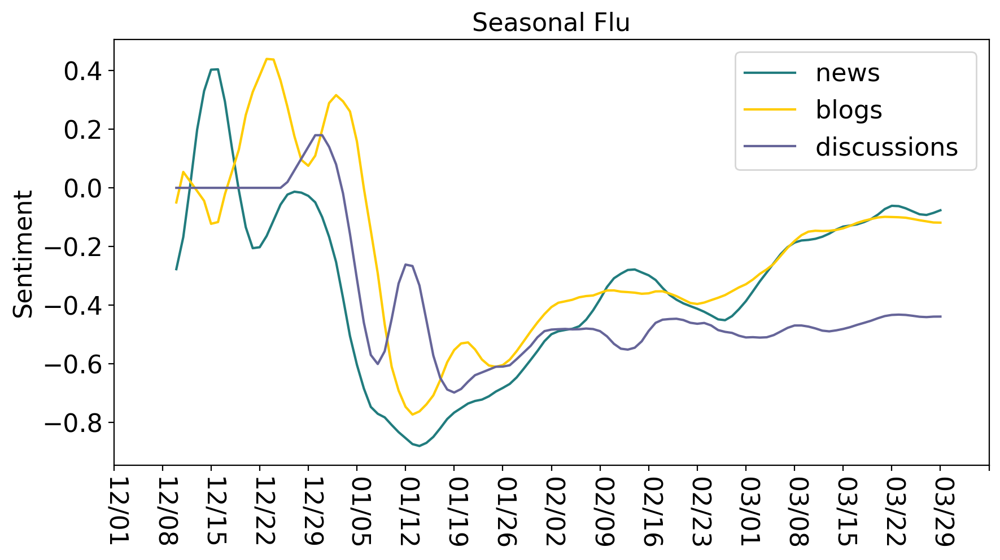

In [14]:
plot_multiparam(platform_daily_theme, [1,1,1], list(groupings.keys()), 16)

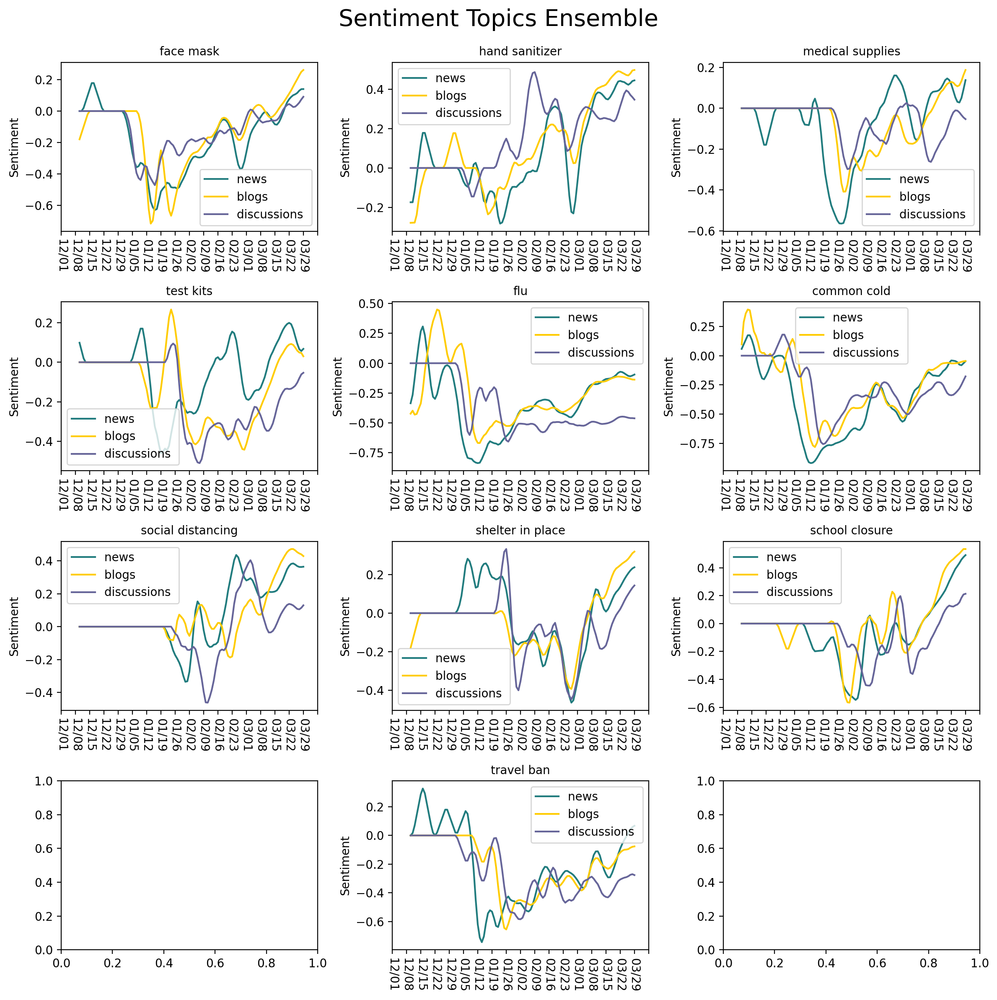

In [15]:
plot_multiparam(platform_daily_topic, [1,1,1], topics, 10, True)

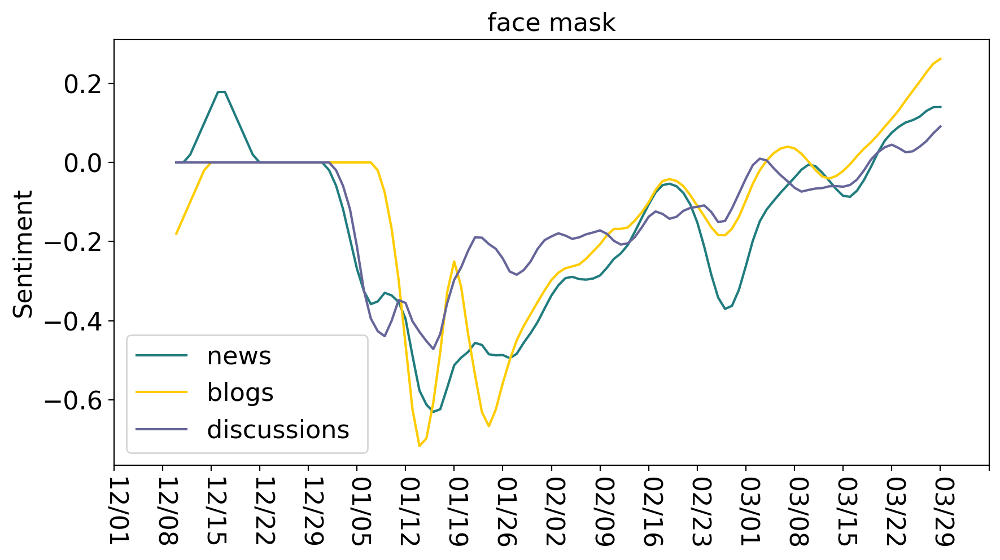

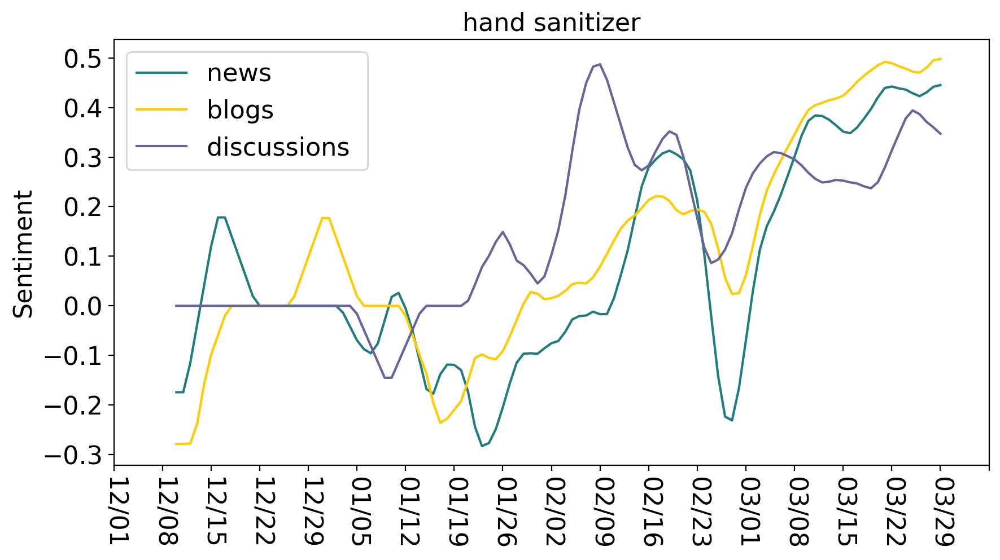

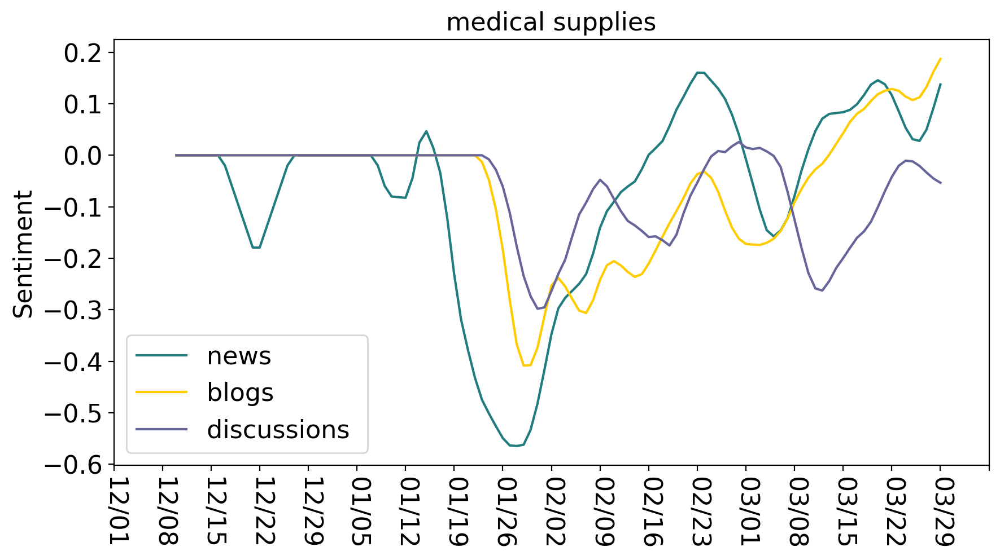

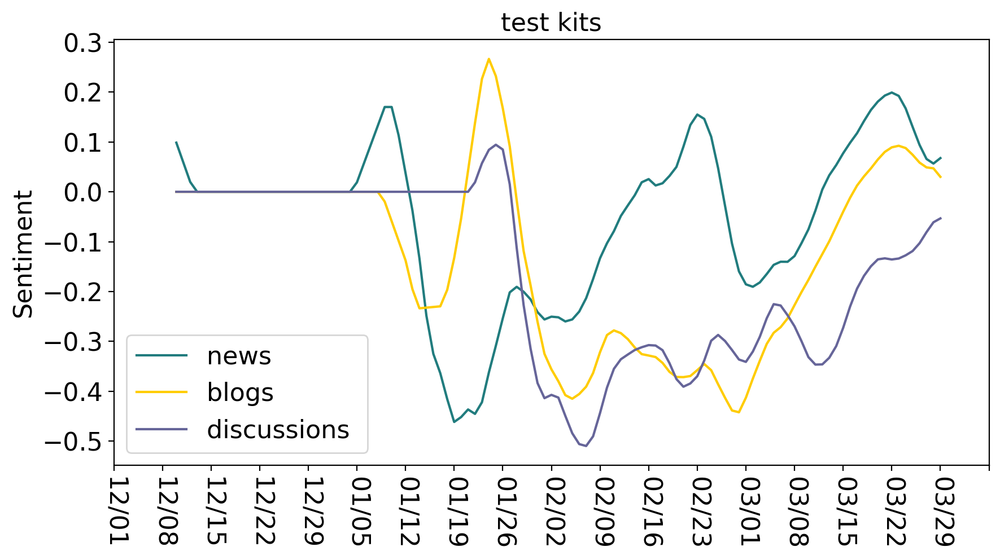

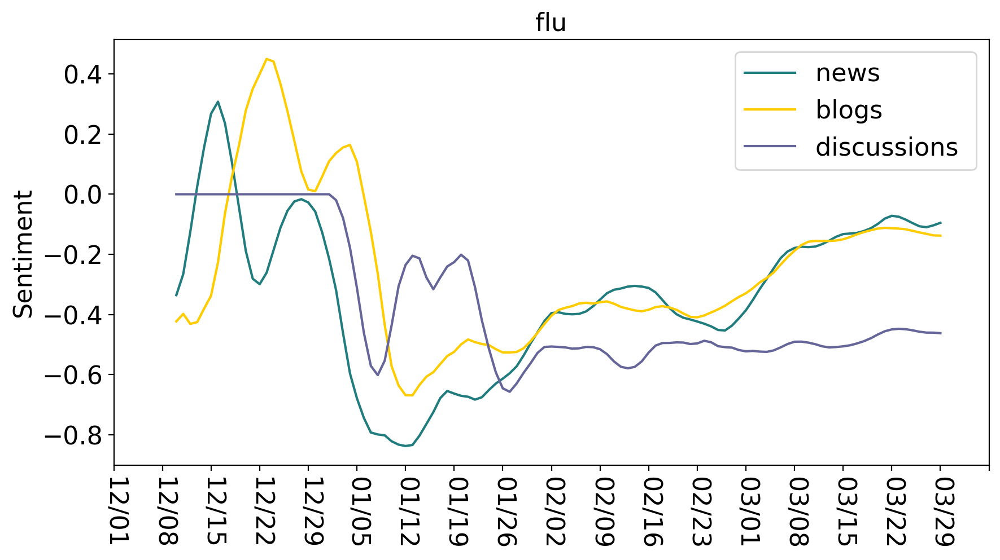

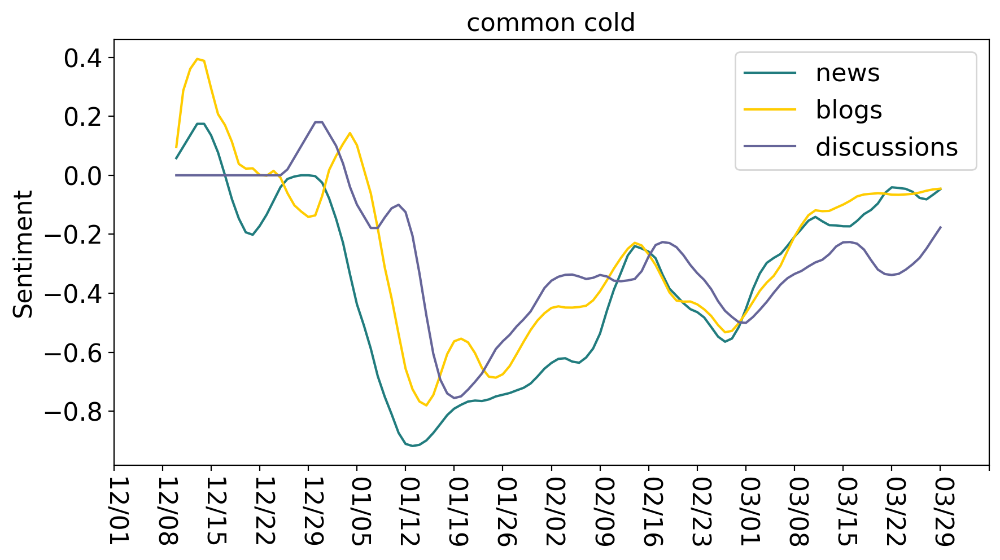

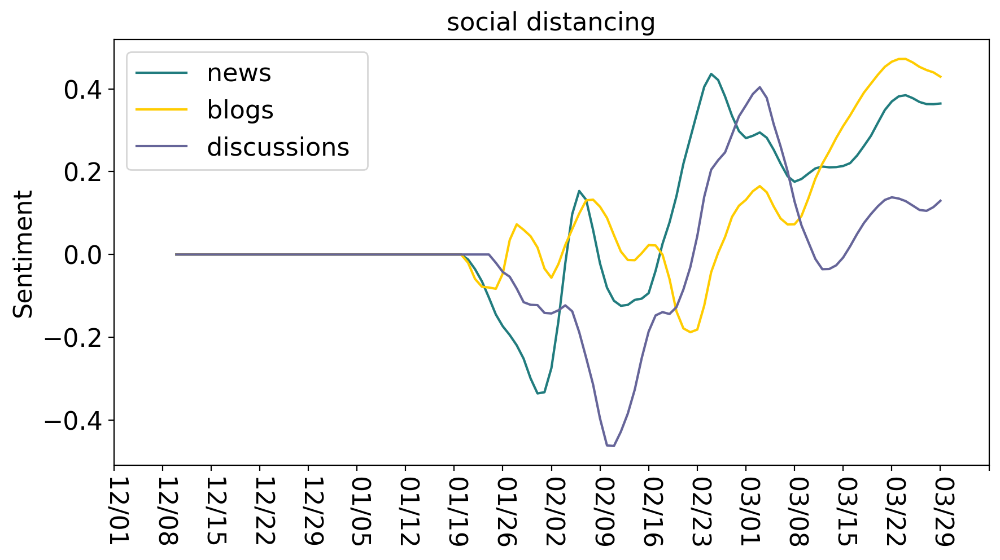

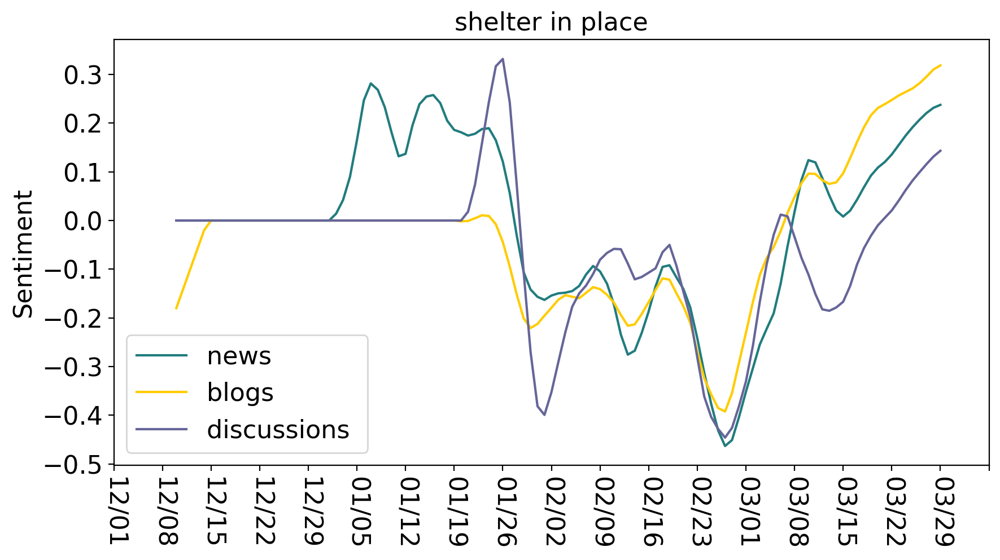

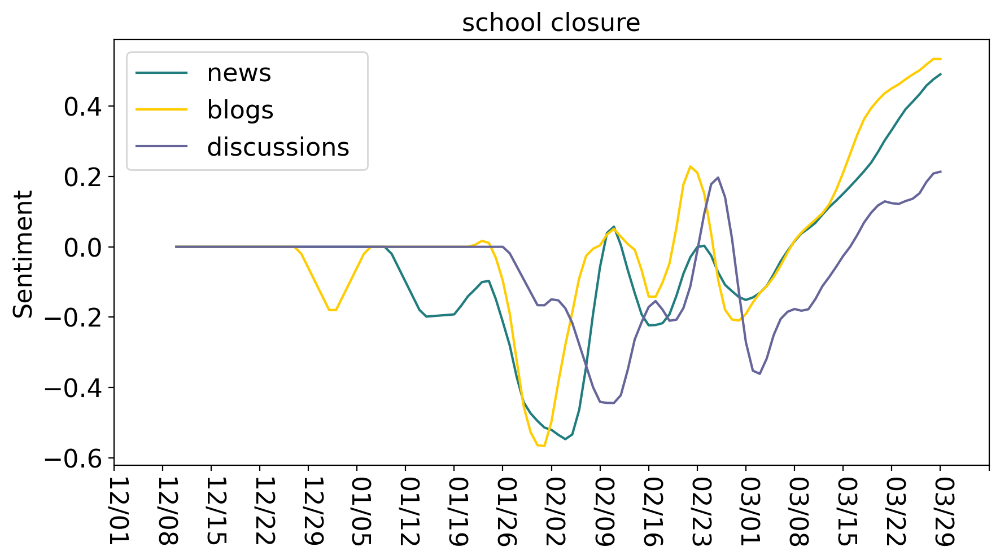

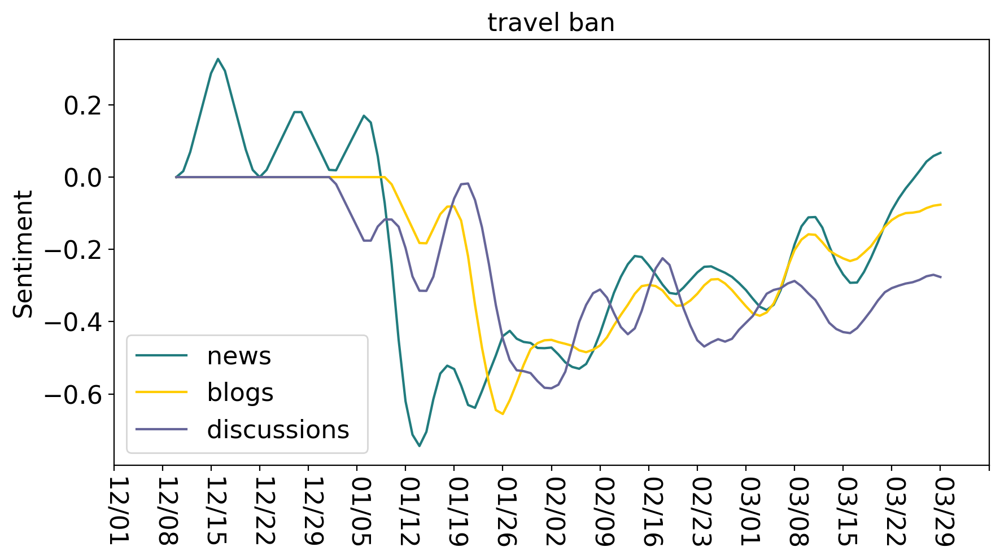

In [16]:
plot_multiparam(platform_daily_topic, [1,1,1], topics, 16)

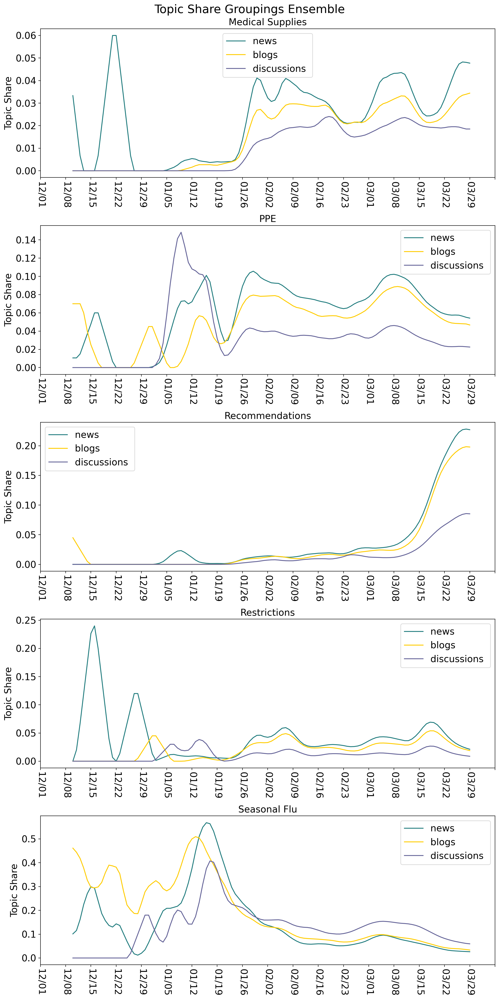

In [17]:
plot_multiparam(platform_daily_theme, [0,0,0], list(groupings.keys()), 16, True)

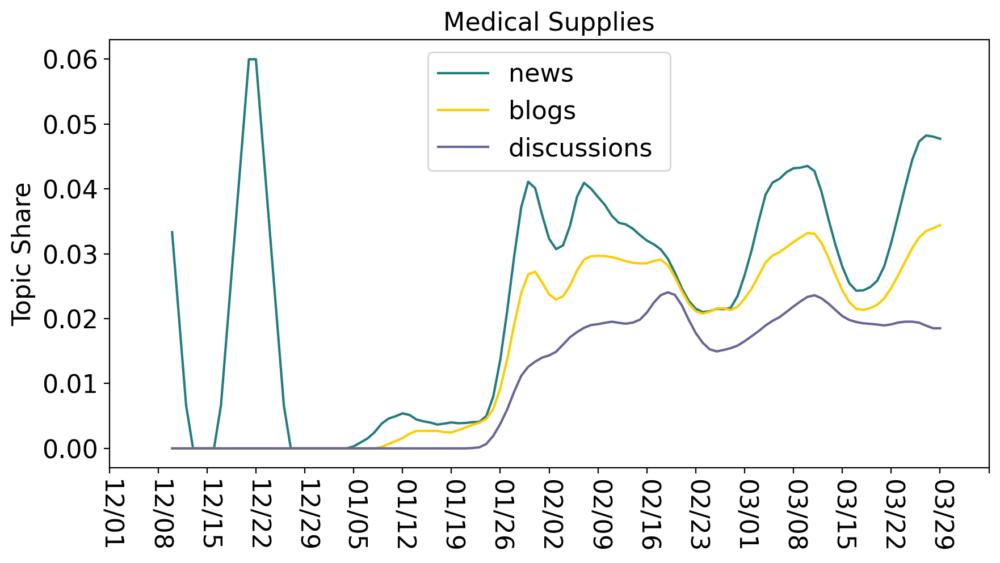

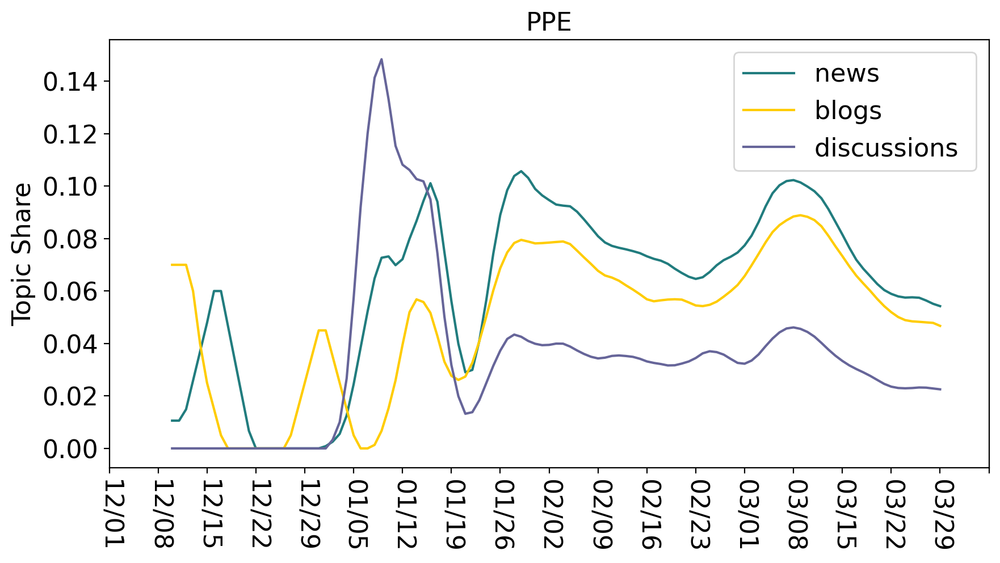

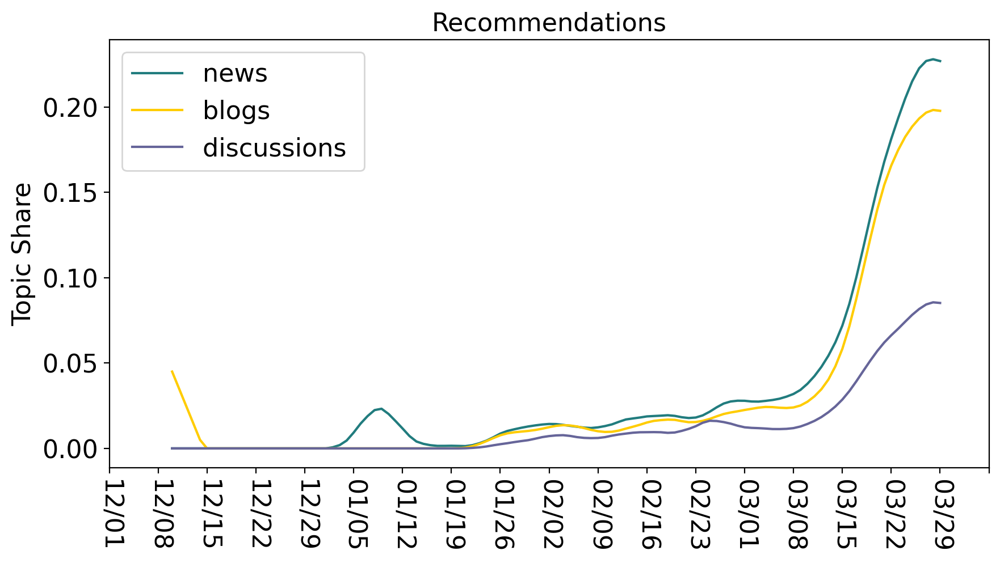

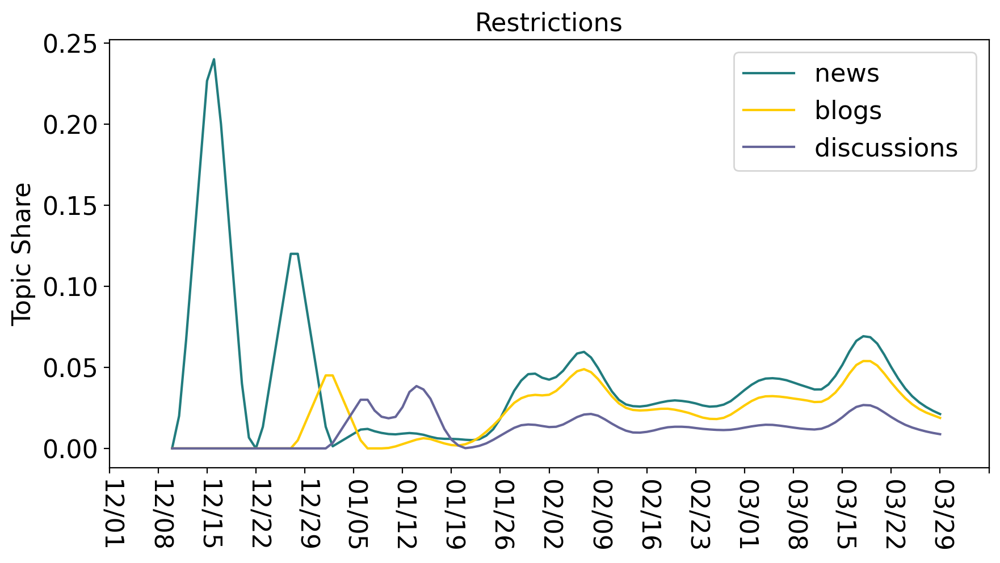

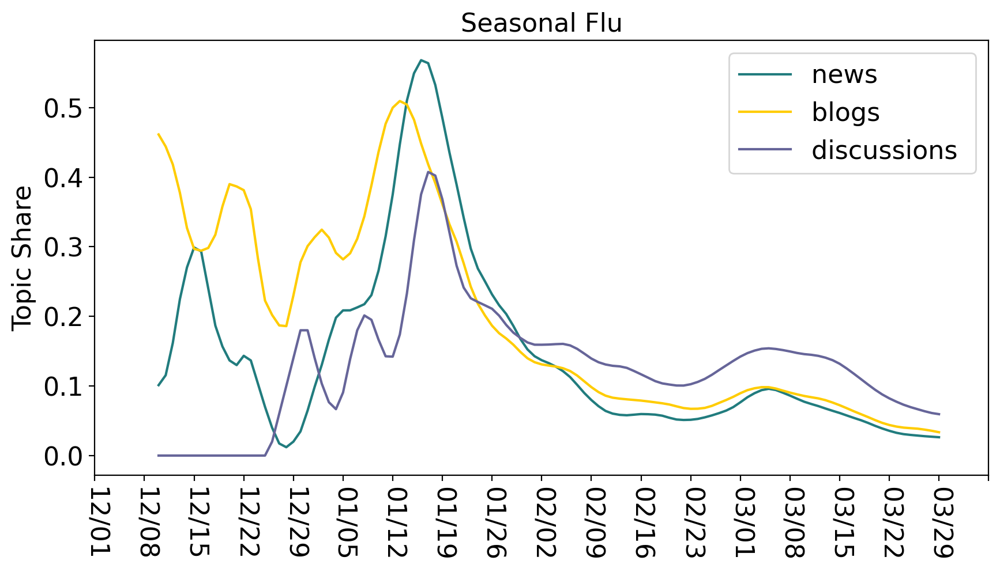

In [18]:
plot_multiparam(platform_daily_theme, [0,0,0], list(groupings.keys()), 16)

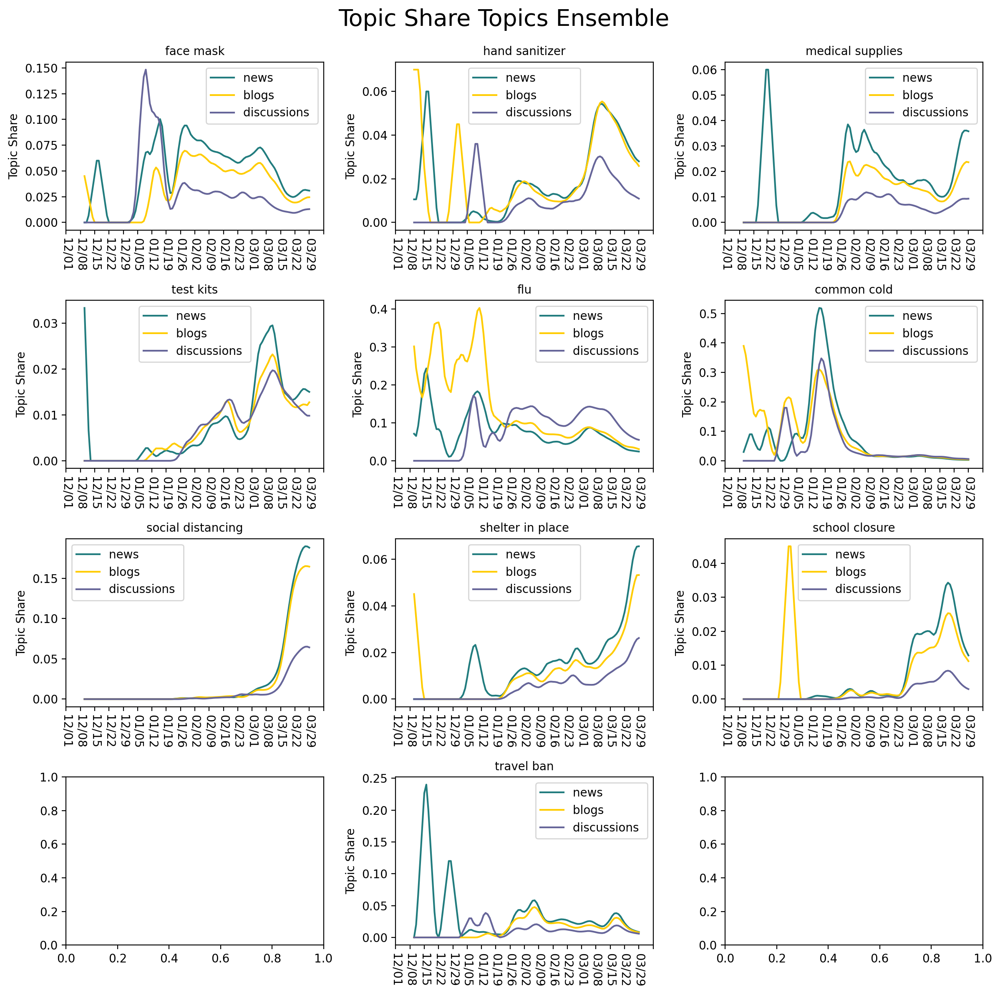

In [19]:
plot_multiparam(platform_daily_topic, [0,0,0], topics, 10, True)

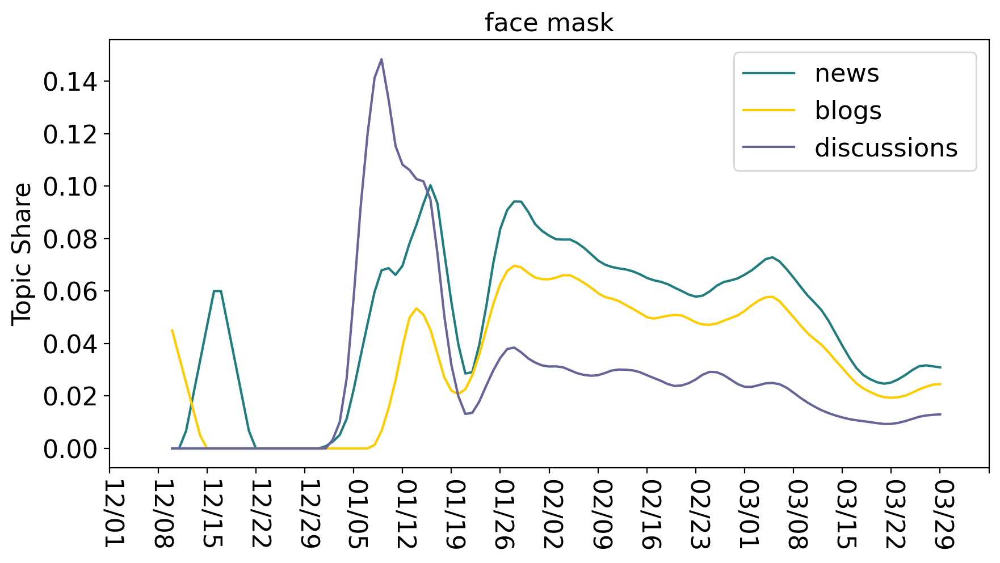

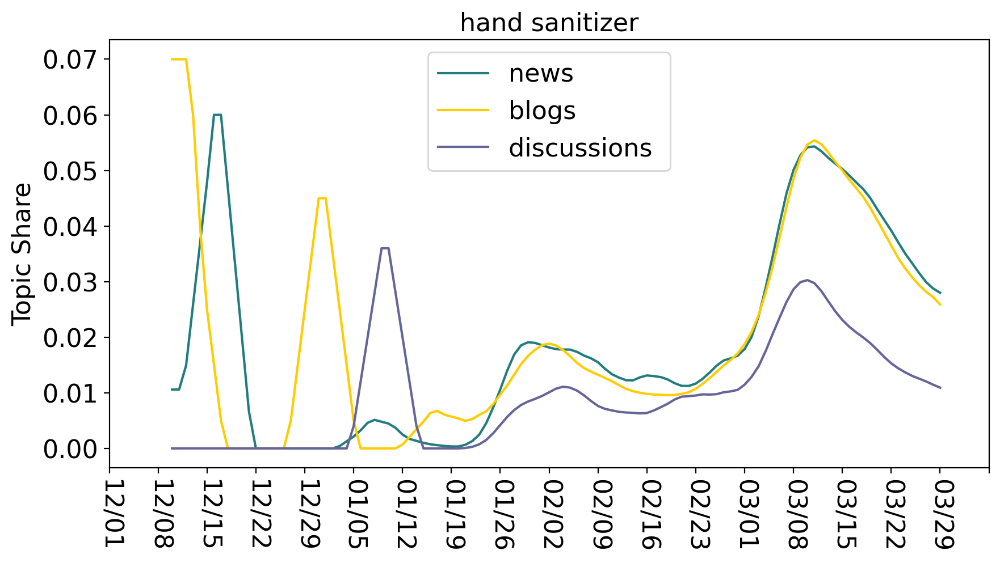

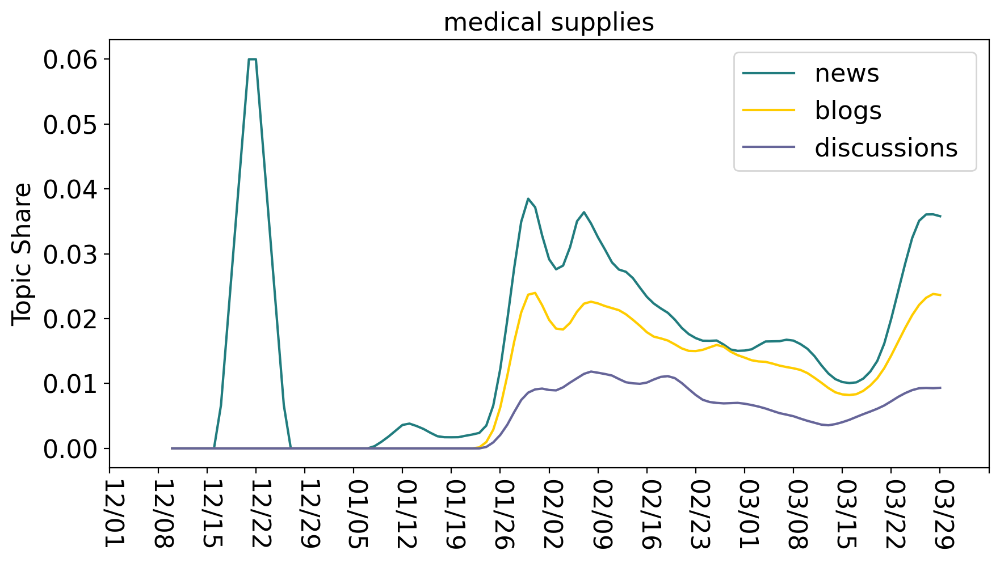

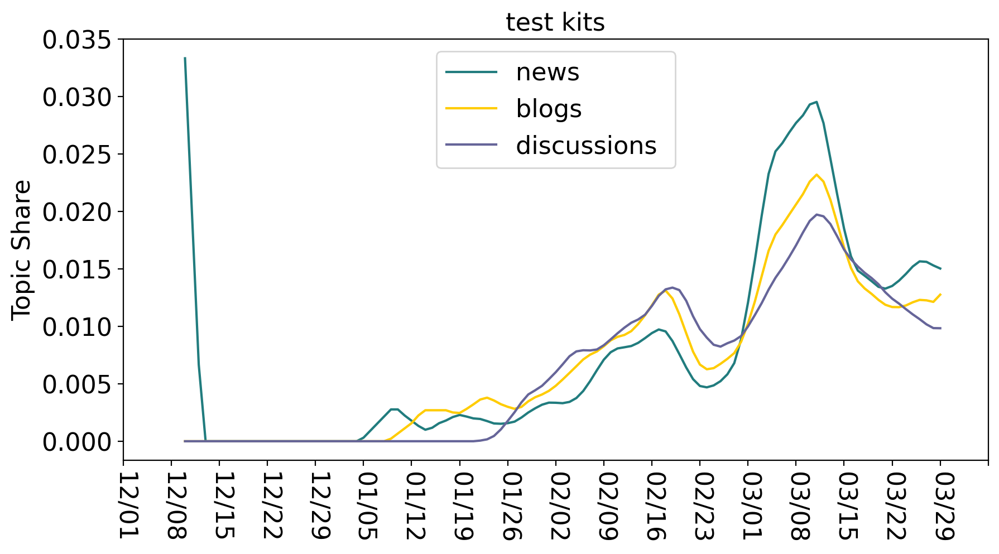

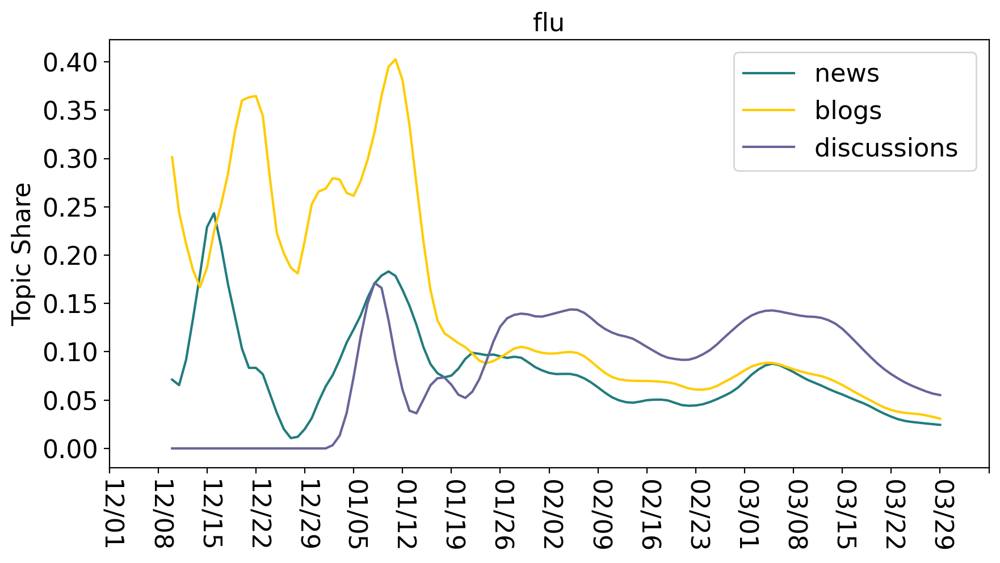

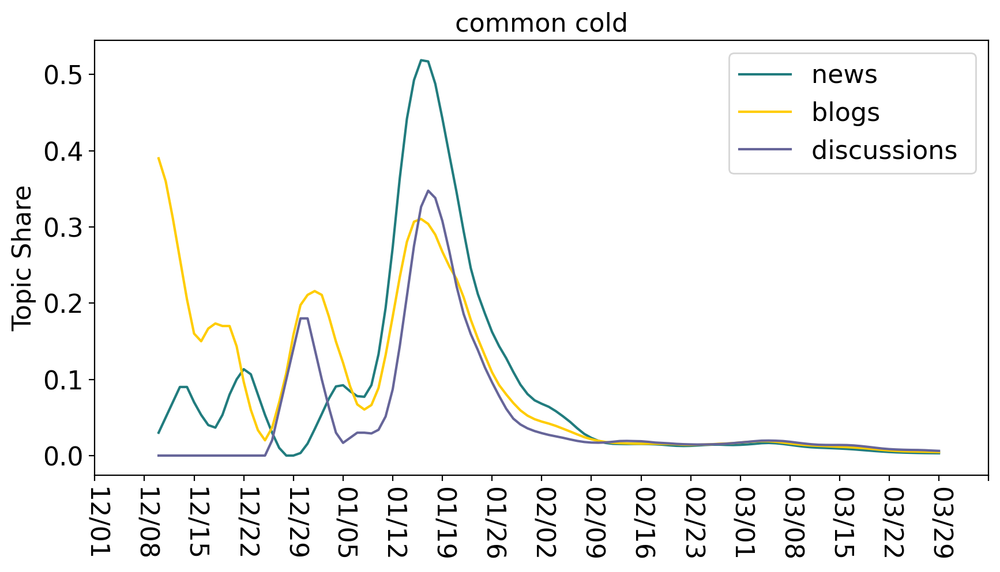

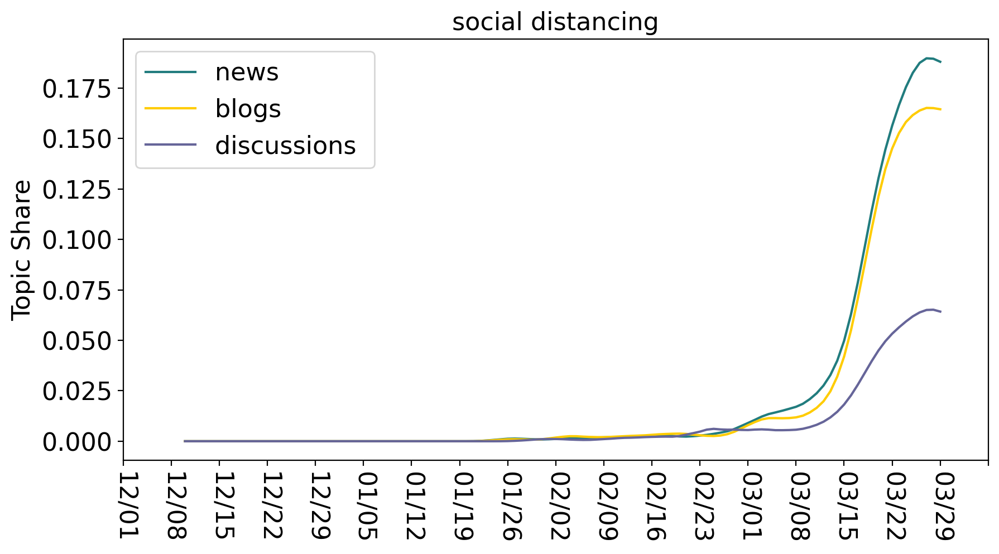

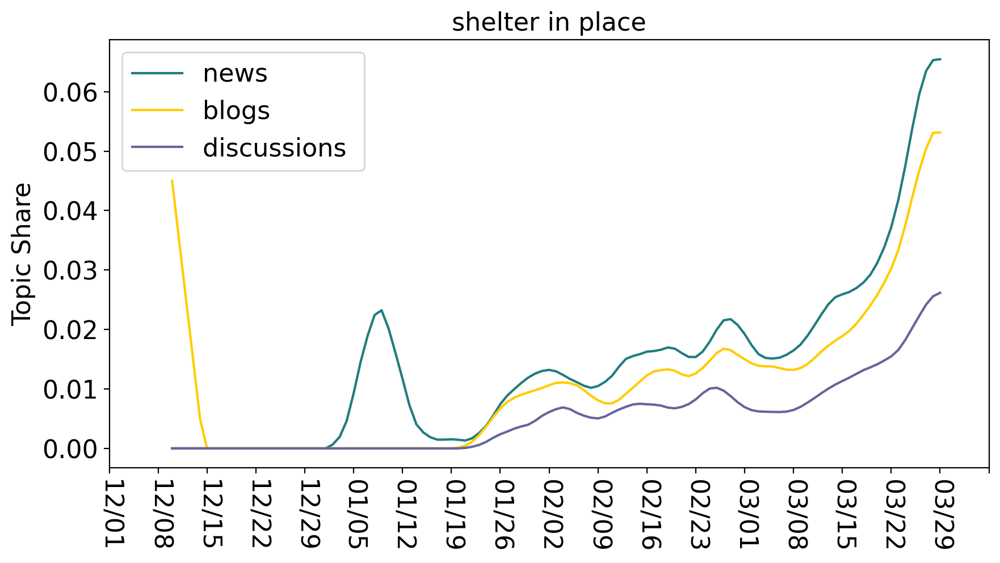

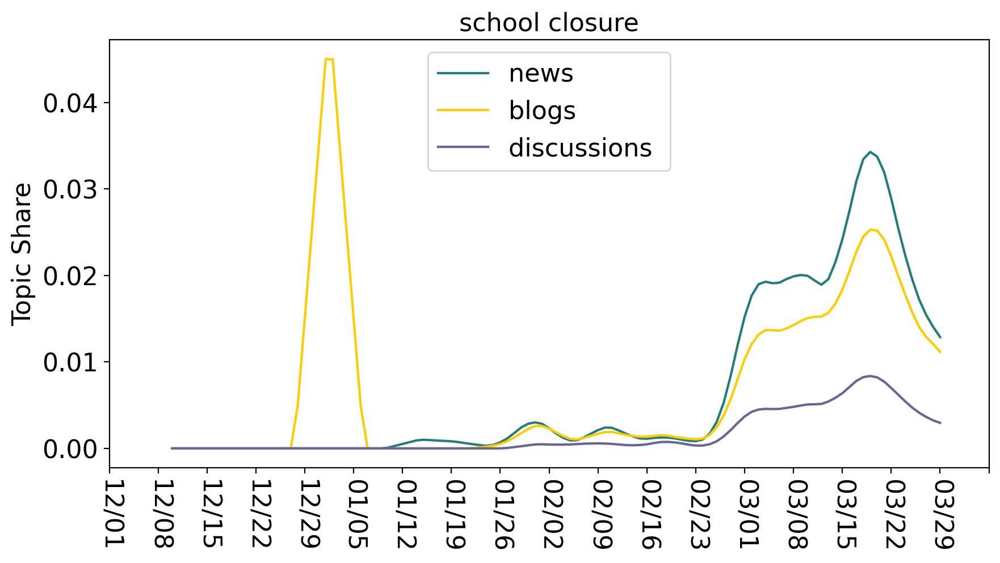

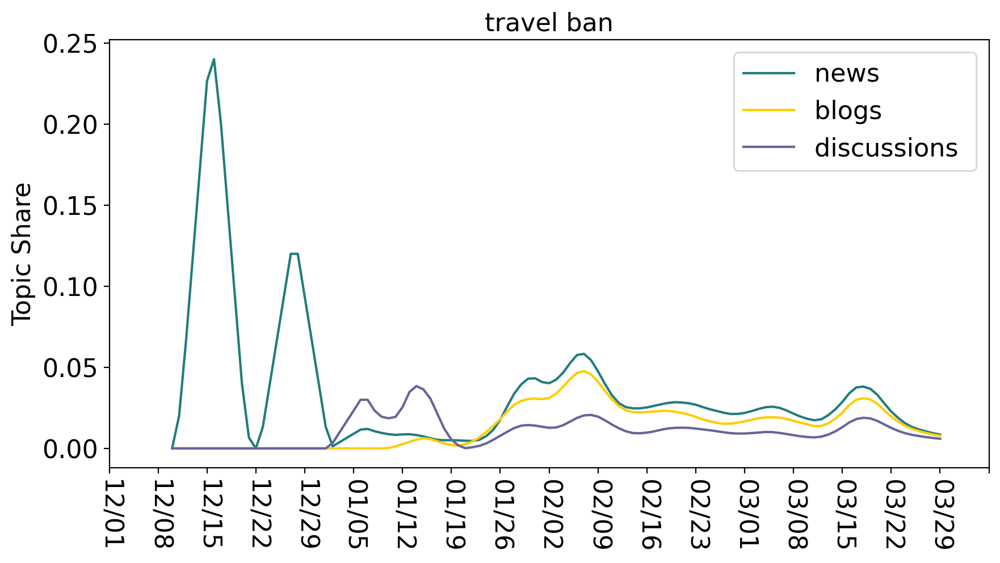

In [20]:
plot_multiparam(platform_daily_topic, [0,0,0], topics, 16)

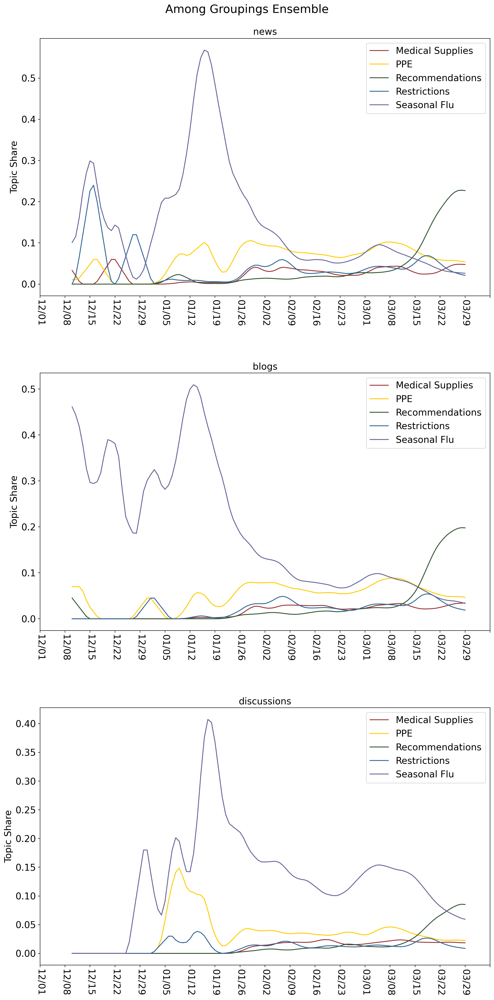

In [21]:
among_group(platform_daily_theme, 0, list(groupings.keys()), 16, True)

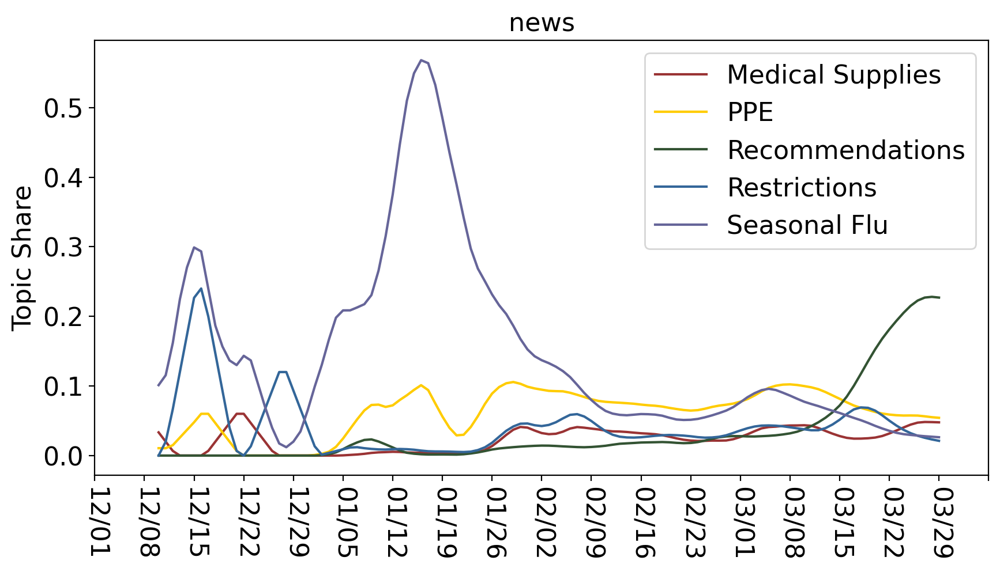

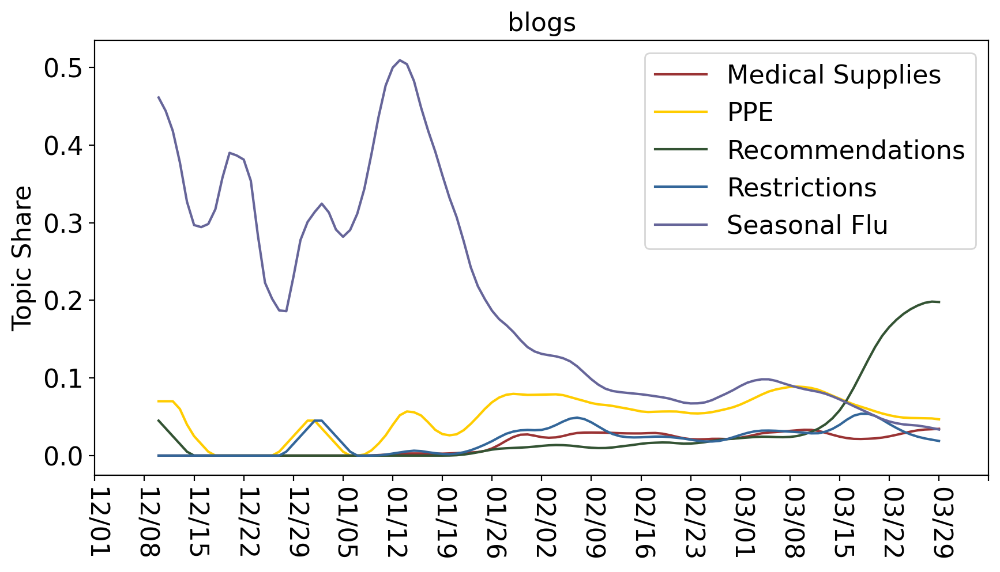

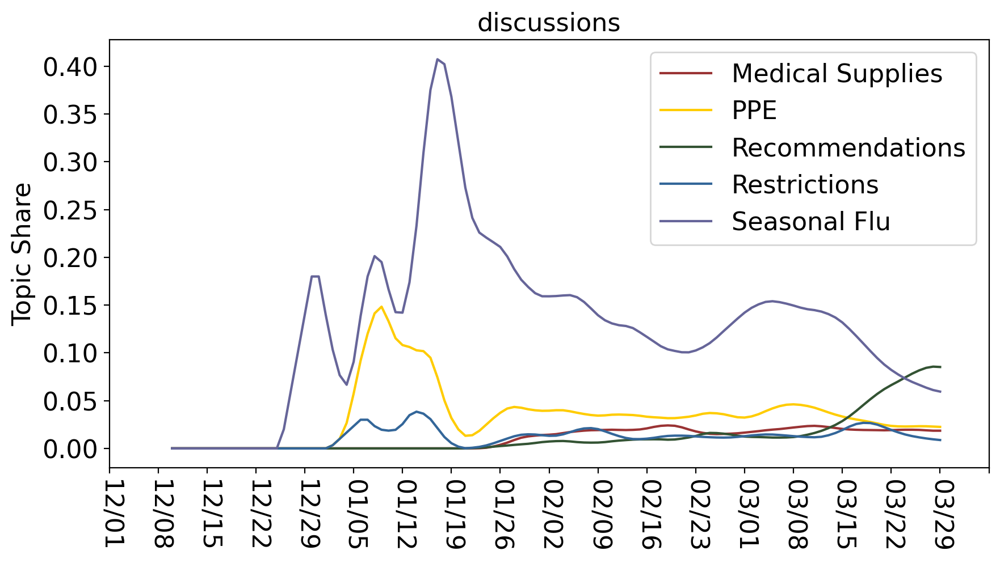

In [22]:
among_group(platform_daily_theme, 0, list(groupings.keys()))

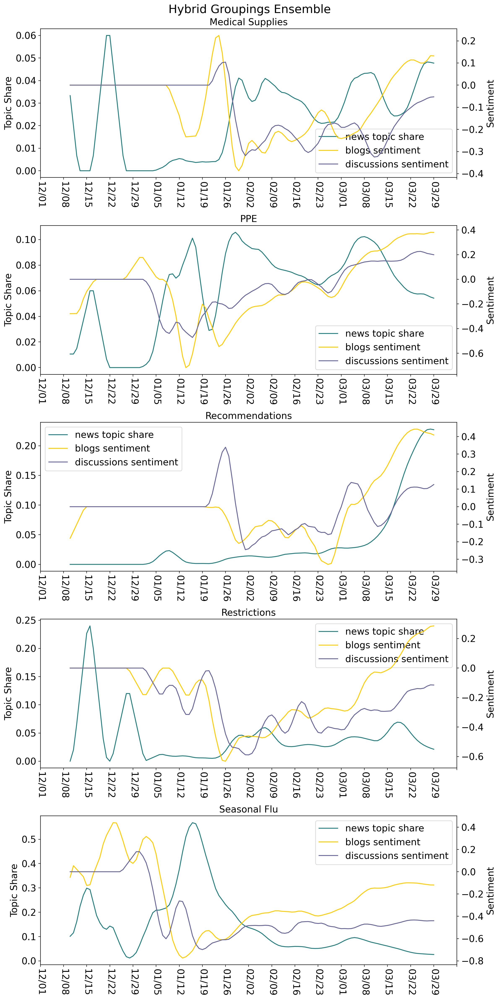

In [23]:
plot_multiparam(platform_daily_theme, [0,1,1], list(groupings.keys()), 16, True)

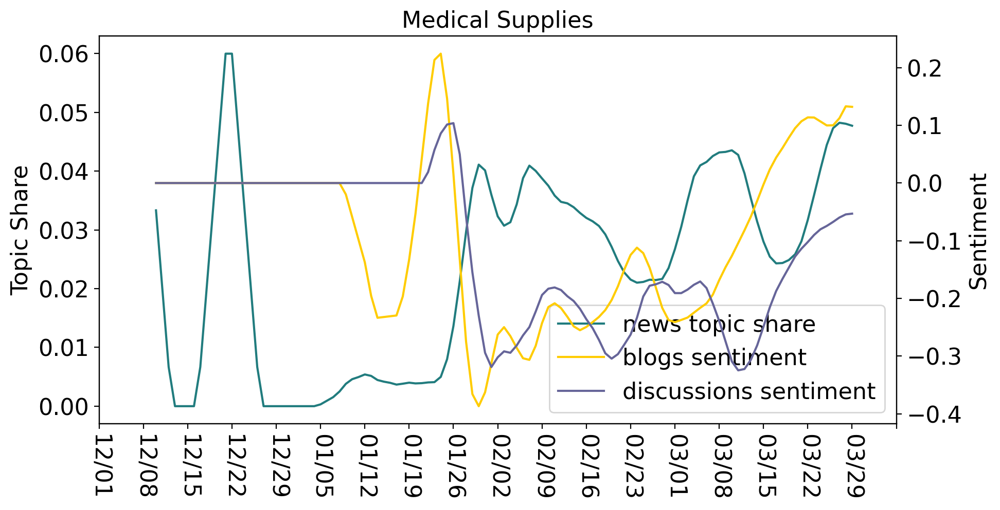

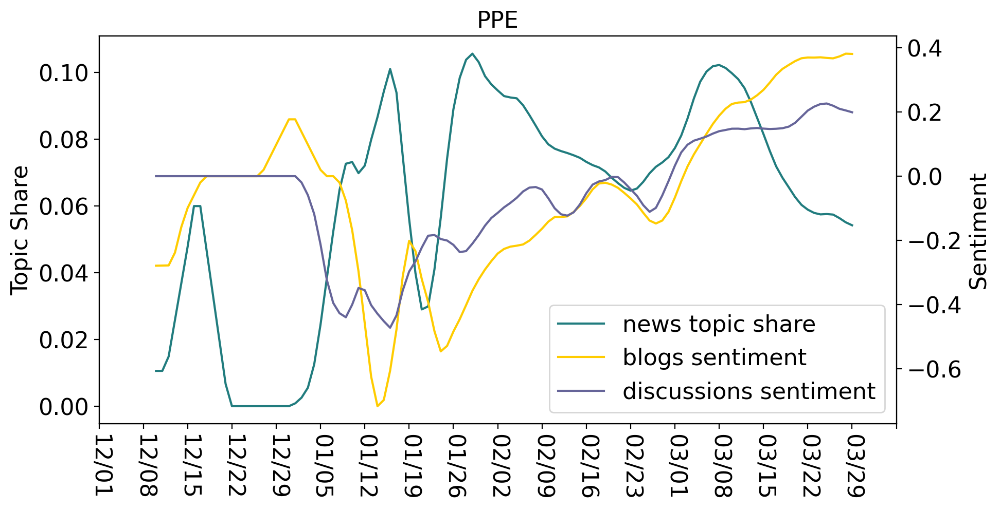

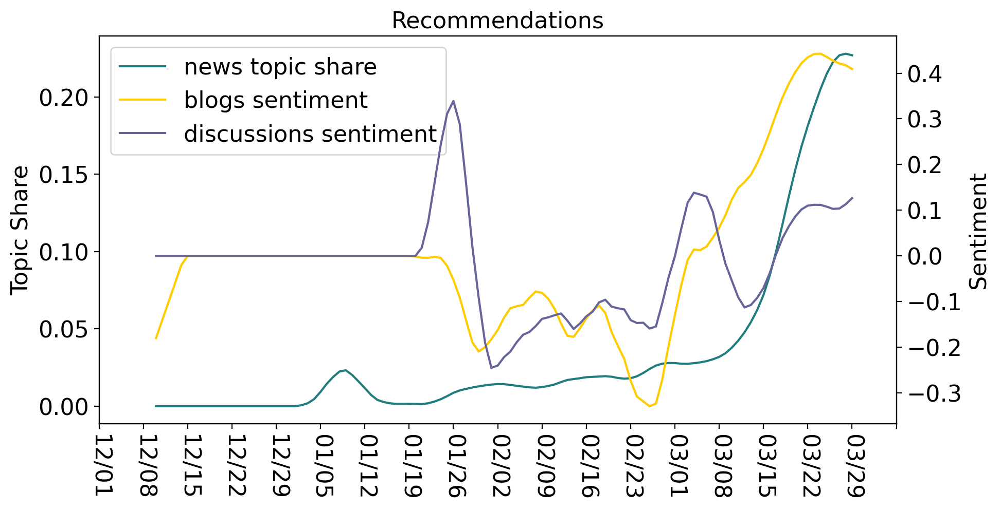

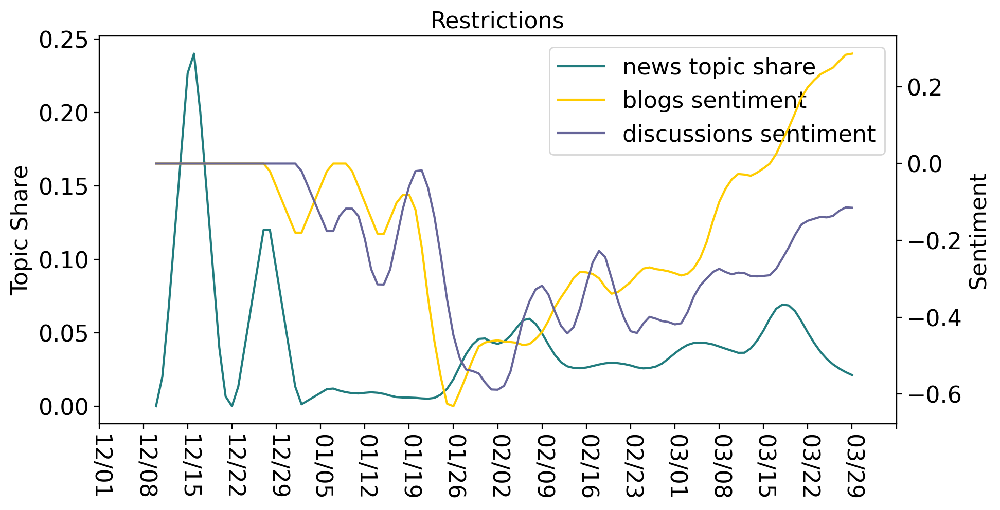

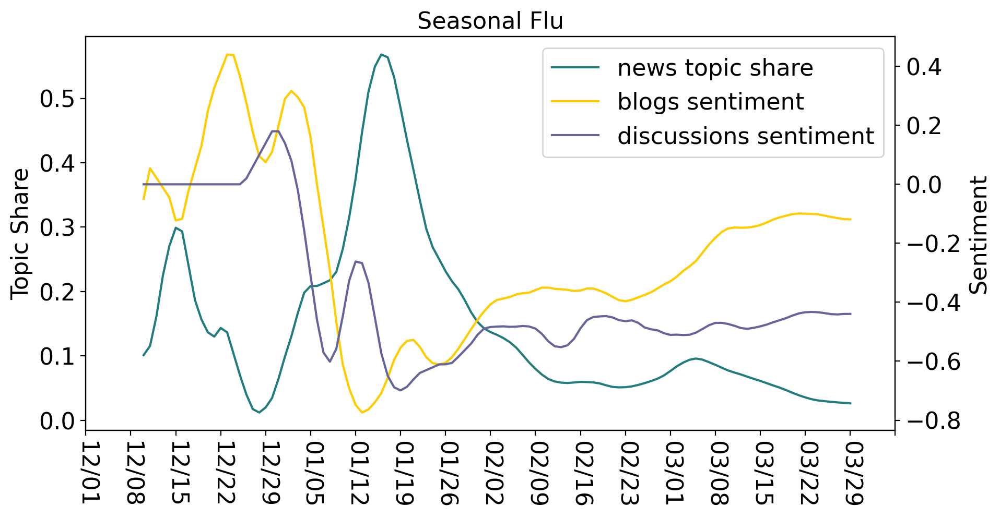

In [24]:
plot_multiparam(platform_daily_theme, [0,1,1], list(groupings.keys()), 16)

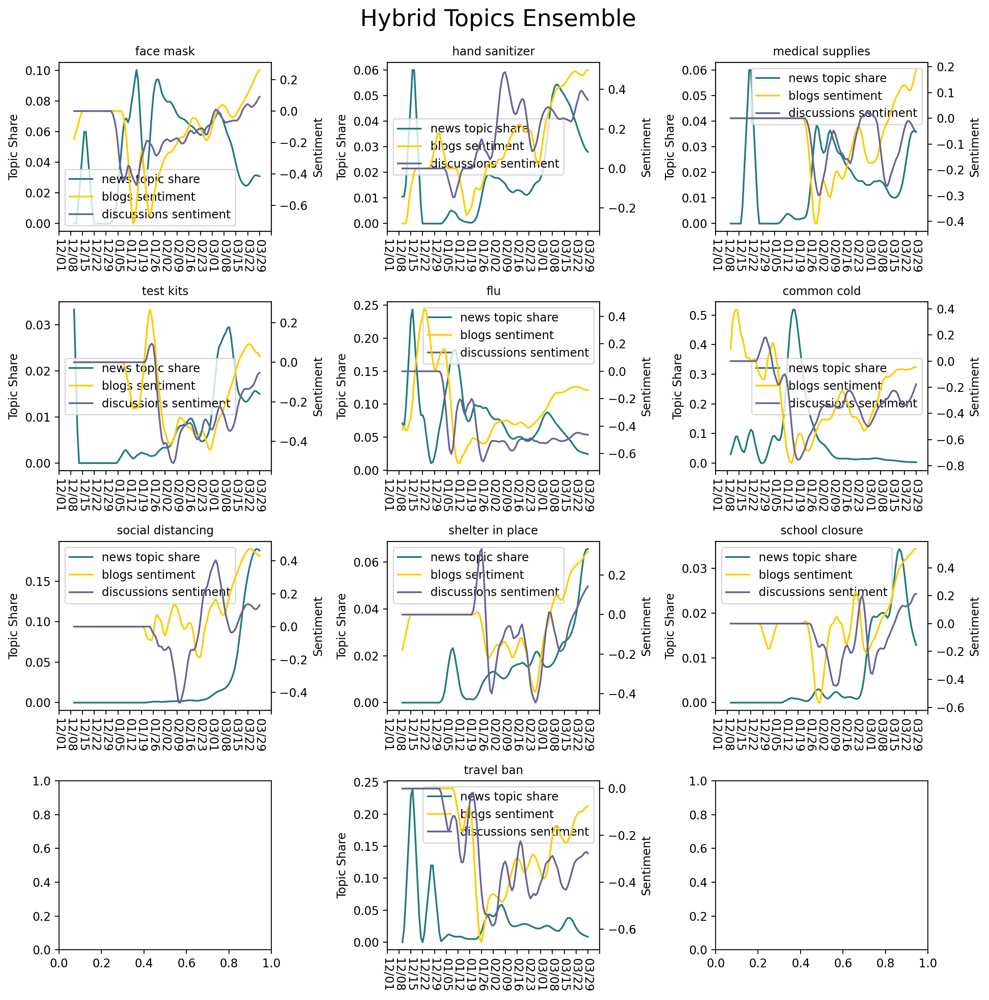

In [25]:
plot_multiparam(platform_daily_topic, [0,1,1], topics, 10, True)

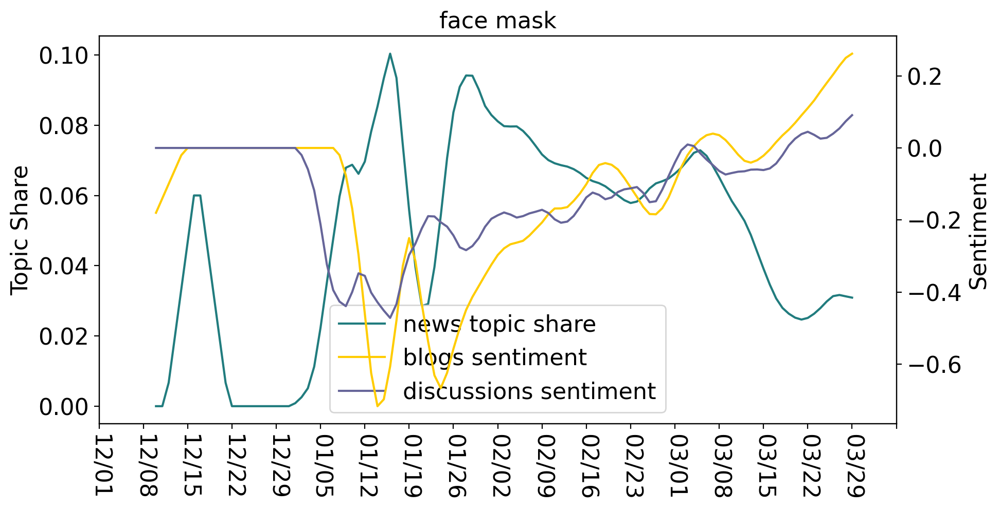

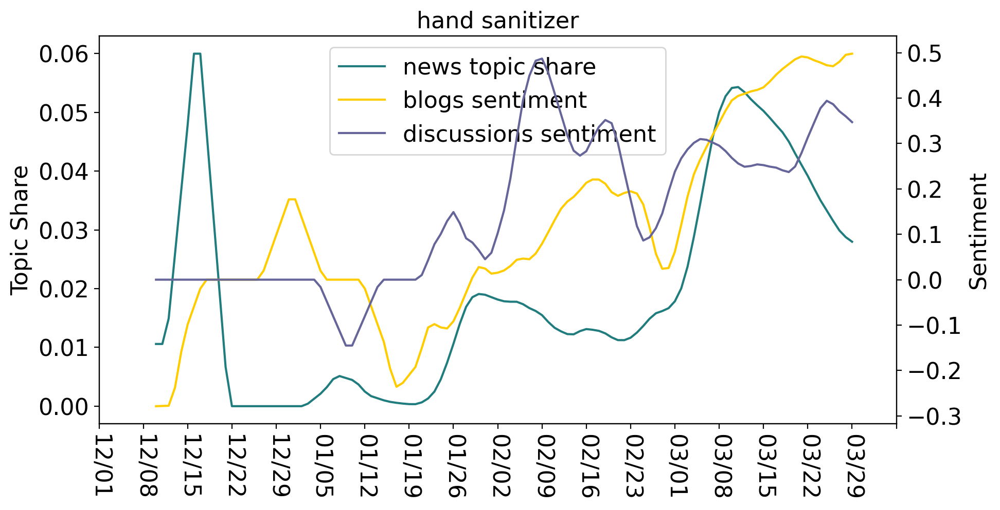

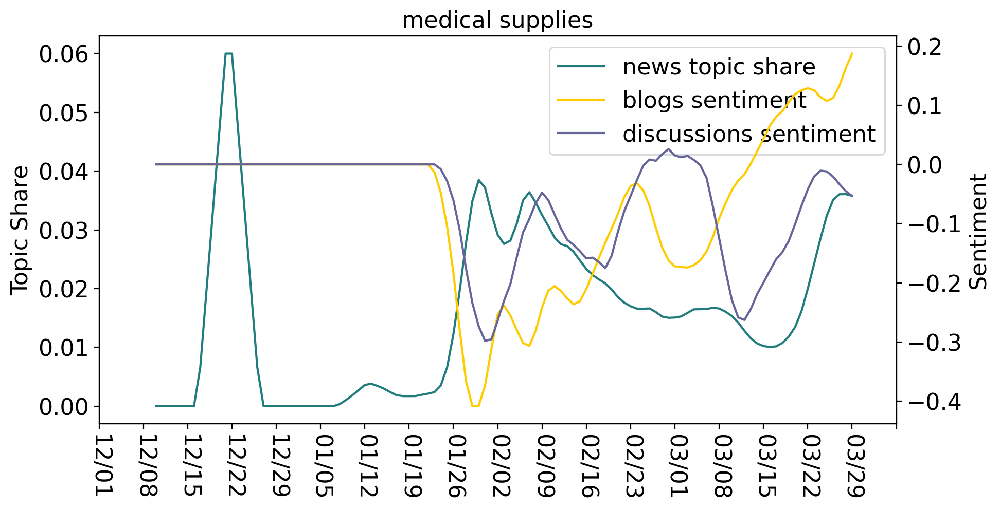

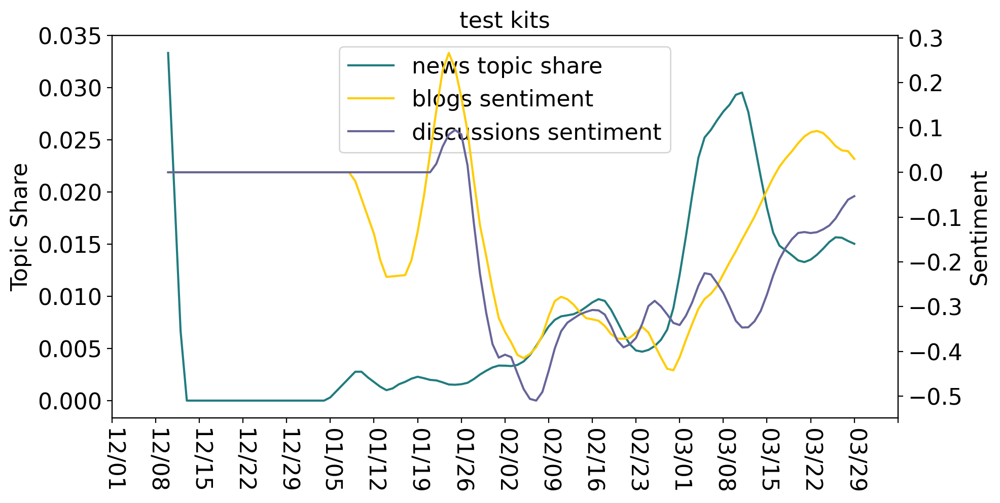

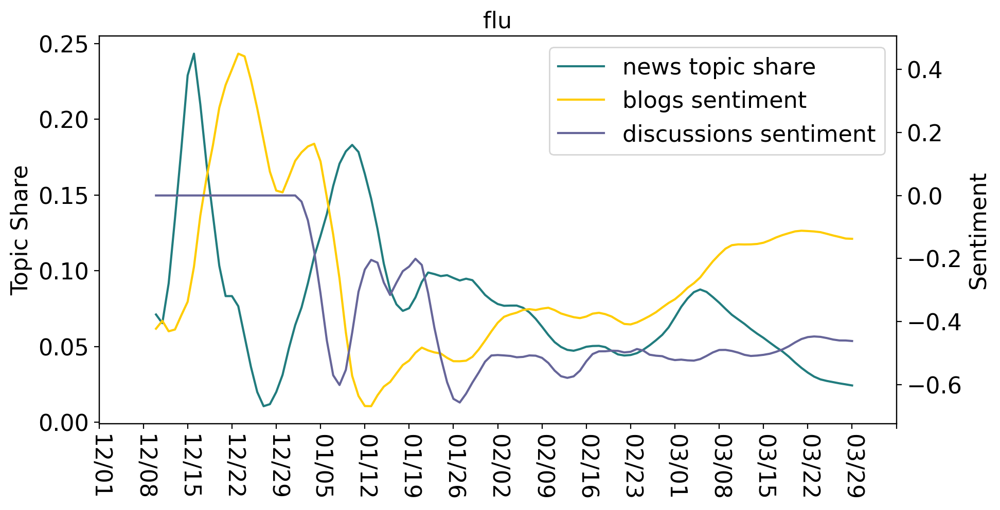

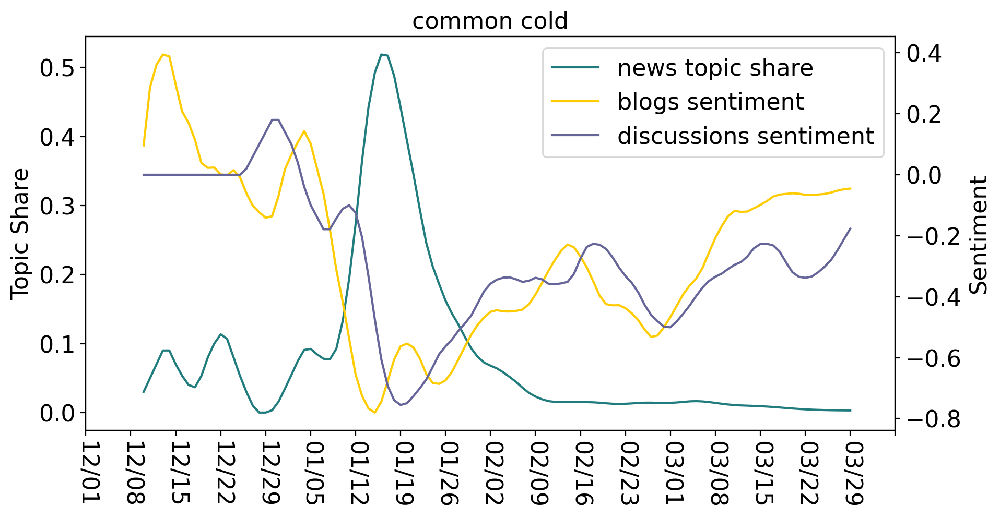

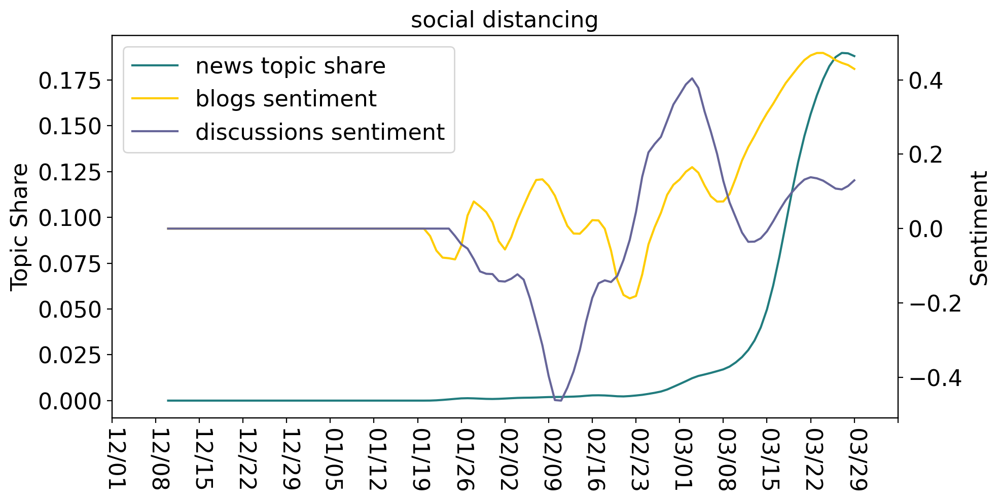

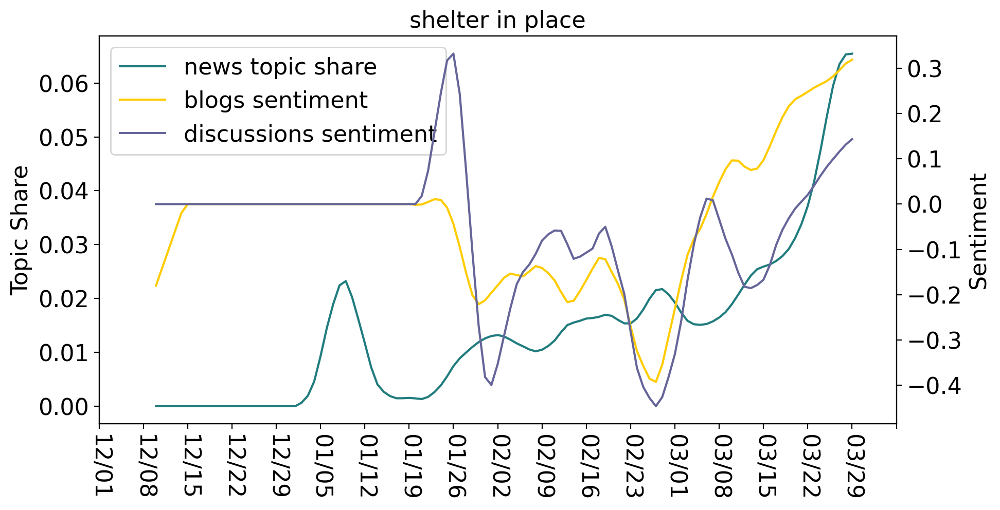

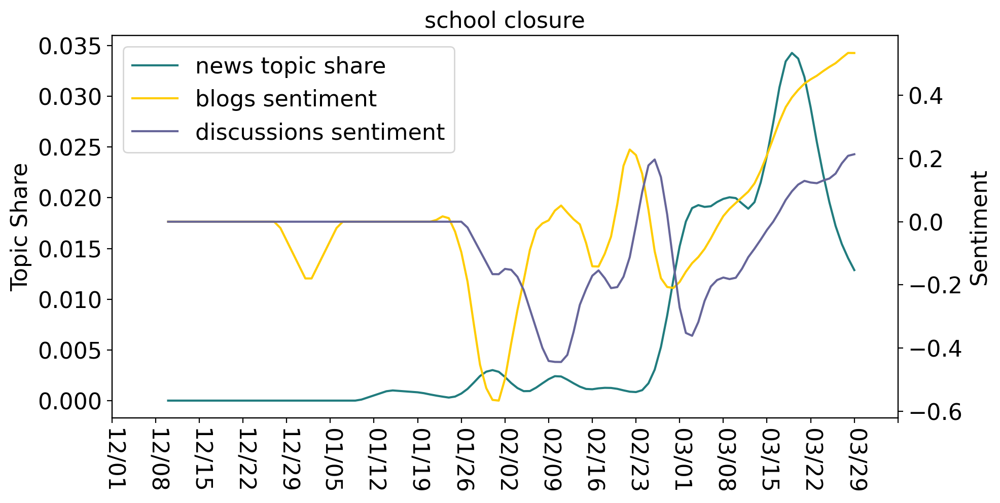

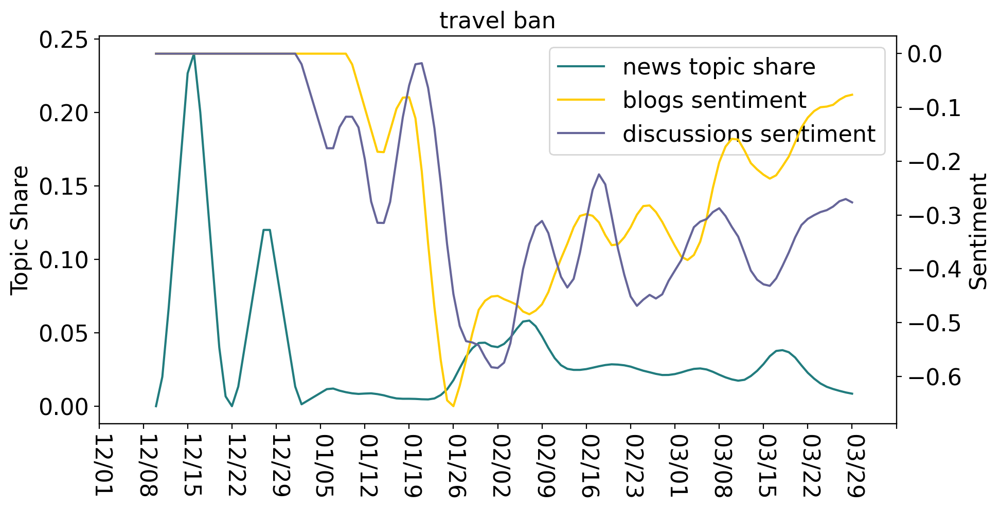

In [26]:
plot_multiparam(platform_daily_topic, [0,1,1], topics, 16)

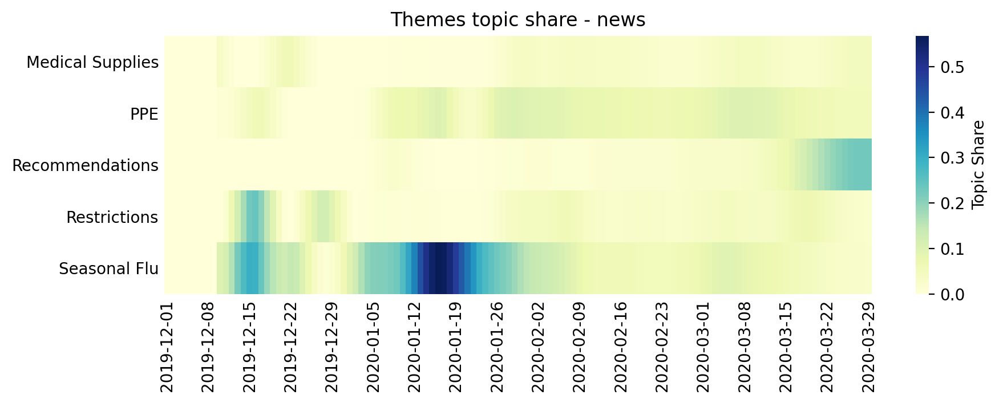

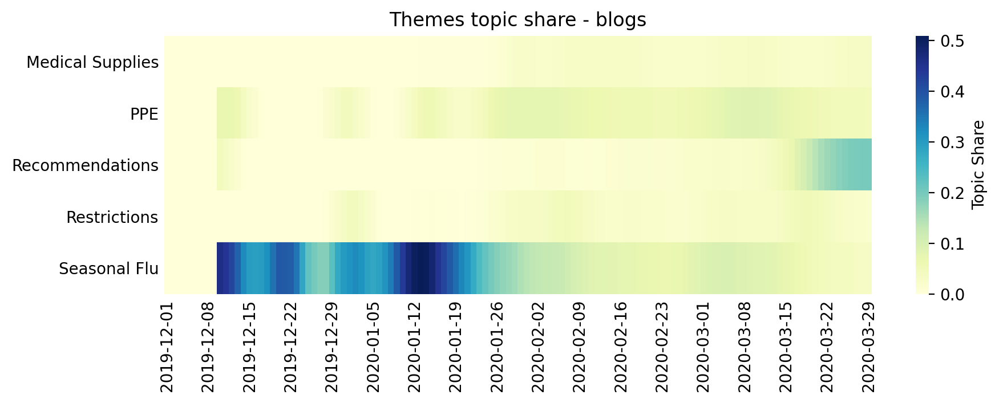

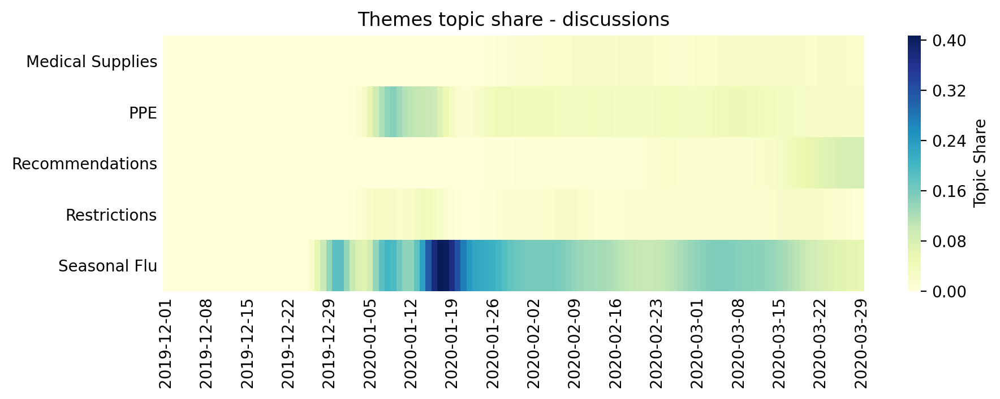

In [27]:
heatmap_plt(heat_groupings)

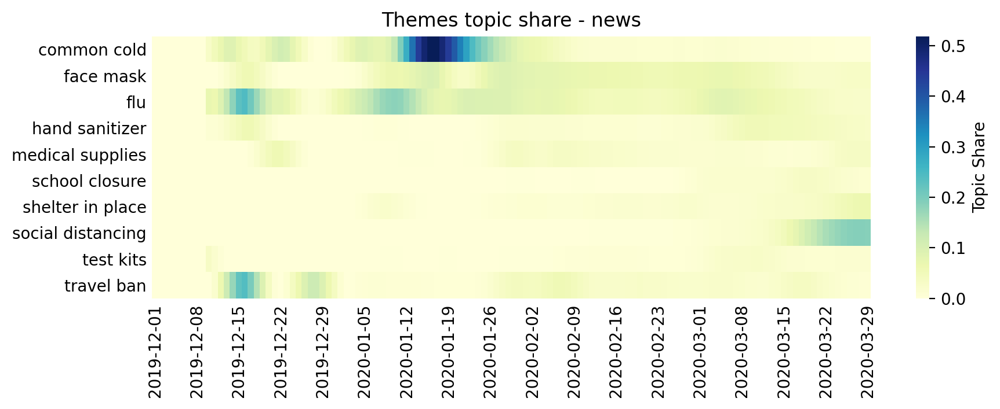

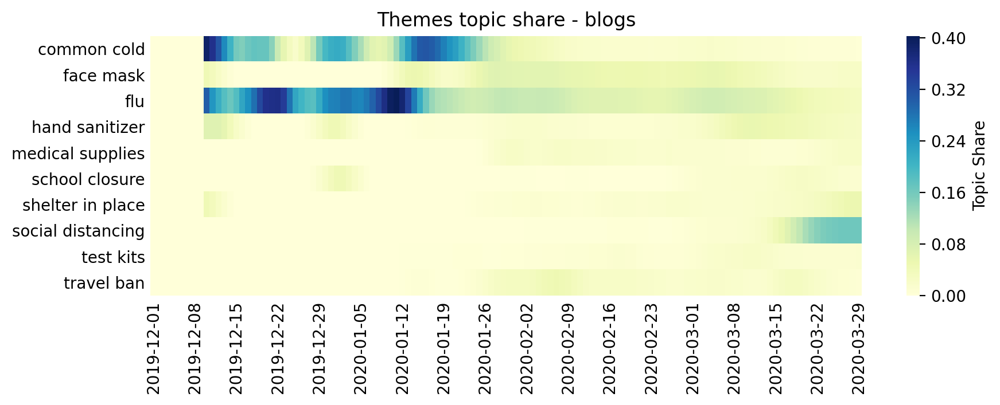

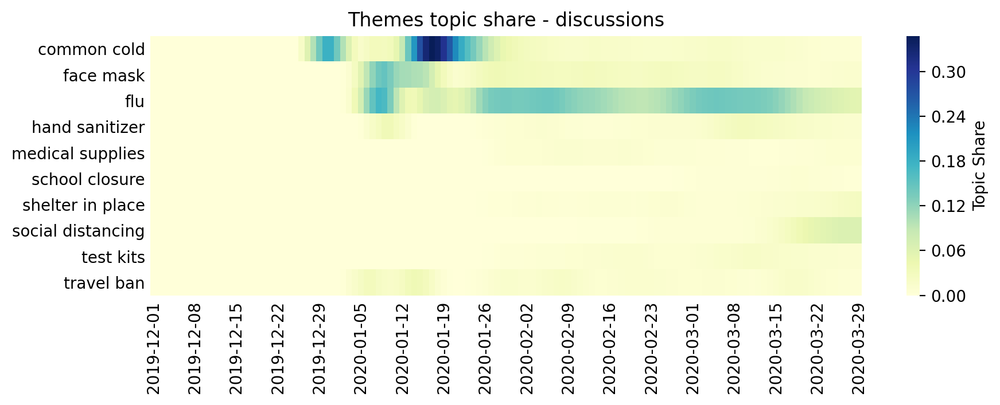

In [28]:
heatmap_plt(heat_topics)